In [3]:
import scipy.io

mat_path = '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Botswana.mat'
data = scipy.io.loadmat(mat_path)

# 打印所有键
print("Keys in .mat file:", data.keys())

# 查看主要数据变量（假设为 'Botswana'）
if 'Botswana' in data:
    print("Botswana shape:", data['Botswana'].shape)
    print("Botswana dtype:", data['Botswana'].dtype)
else:
    # 打印所有变量的类型和形状
    for k in data:
        if not k.startswith('__'):
            print(f"{k}: type={type(data[k])}, shape={getattr(data[k], 'shape', None)}")

Keys in .mat file: dict_keys(['__header__', '__version__', '__globals__', 'Botswana'])
Botswana shape: (1476, 256, 145)
Botswana dtype: uint16


In [5]:
import scipy.io

mat_path = '/data2/users/yujieliang/dataset/Chikusei/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729_Ground_Truth.mat'
data = scipy.io.loadmat(mat_path)

# 打印所有键
print("Keys in .mat file:", data.keys())

# 查看主要数据变量
for key in data:
    if not key.startswith('__'):  # 忽略MATLAB元数据
        print(f"{key}: type={type(data[key])}, shape={getattr(data[key], 'shape', None)}")

Keys in .mat file: dict_keys(['__header__', '__version__', '__globals__', 'GT'])
GT: type=<class 'numpy.ndarray'>, shape=(1, 1)


In [8]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import os

def analyze_chikusei_main_data():
    """分析Chikusei主数据文件（MATLAB v7.3格式）"""
    
    mat_path = '/data2/users/yujieliang/dataset/Chikusei/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729.mat'
    
    print("=== Chikusei 主数据文件分析 ===")
    print(f"文件路径: {mat_path}")
    
    # 检查文件是否存在
    if not os.path.exists(mat_path):
        print(f"❌ 文件不存在: {mat_path}")
        return
    
    file_size = os.path.getsize(mat_path) / (1024**3)
    print(f"文件大小: {file_size:.2f} GB")
    
    try:
        # 使用h5py读取MATLAB v7.3文件
        with h5py.File(mat_path, 'r') as f:
            print(f"\n所有数据键: {list(f.keys())}")
            
            # 递归遍历所有组和数据集
            def print_structure(name, obj):
                indent = "  " * (name.count('/'))
                if isinstance(obj, h5py.Dataset):
                    print(f"{indent}数据集 {name}: 形状={obj.shape}, 类型={obj.dtype}")
                    
                    # 如果数据集不太大，显示更多信息
                    if obj.size < 1e8:  # 小于100M元素
                        try:
                            # 读取一小部分数据来分析
                            if len(obj.shape) == 3:
                                sample_data = obj[:min(100, obj.shape[0]), :min(100, obj.shape[1]), :]
                            elif len(obj.shape) == 2:
                                sample_data = obj[:min(100, obj.shape[0]), :min(100, obj.shape[1])]
                            else:
                                sample_data = obj[...]
                            
                            print(f"{indent}    数值范围: [{sample_data.min():.6f}, {sample_data.max():.6f}]")
                            print(f"{indent}    数据统计: 均值={sample_data.mean():.6f}, 标准差={sample_data.std():.6f}")
                            
                            # 判断数据类型
                            if len(obj.shape) == 3:
                                h, w, c = obj.shape
                                print(f"{indent}    → 可能是高光谱图像: {h}×{w}×{c}")
                                if c > 50:
                                    print(f"{indent}    → 高光谱通道数: {c}")
                            elif len(obj.shape) == 2:
                                print(f"{indent}    → 可能是2D图像或标签: {obj.shape}")
                                
                        except Exception as e:
                            print(f"{indent}    数据读取错误: {e}")
                    else:
                        print(f"{indent}    数据集过大，跳过详细分析")
                        
                elif isinstance(obj, h5py.Group):
                    print(f"{indent}组 {name}:")
            
            print("\n文件结构:")
            f.visititems(print_structure)
            
            # 查找可能的高光谱数据
            print(f"\n=== 寻找高光谱数据 ===")
            possible_keys = ['chikusei', 'data', 'hyperspectral', 'image', 'hsi']
            
            hsi_data = None
            found_key = None
            
            # 尝试不同的键名
            for key in f.keys():
                dataset = f[key]
                if isinstance(dataset, h5py.Dataset):
                    if len(dataset.shape) == 3 and dataset.shape[2] > 50:
                        print(f"找到可能的高光谱数据: {key}")
                        print(f"  形状: {dataset.shape}")
                        print(f"  数据类型: {dataset.dtype}")
                        
                        # 读取一小块数据进行分析
                        try:
                            sample_data = dataset[:100, :100, :]
                            print(f"  样本数据范围: [{sample_data.min():.6f}, {sample_data.max():.6f}]")
                            
                            # 分析光谱特性
                            print(f"  光谱通道数: {dataset.shape[2]}")
                            if dataset.shape[2] in [128, 144, 224]:
                                print(f"  ✓ 符合常见高光谱通道数")
                            
                            hsi_data = dataset
                            found_key = key
                            break
                            
                        except Exception as e:
                            print(f"  读取样本数据失败: {e}")
            
            # 如果找到高光谱数据，进行详细分析
            if hsi_data is not None:
                print(f"\n=== 高光谱数据详细分析 ===")
                print(f"数据键: {found_key}")
                print(f"完整形状: {hsi_data.shape}")
                
                h, w, c = hsi_data.shape
                print(f"空间尺寸: {h} × {w}")
                print(f"光谱通道: {c}")
                
                # 分析几个典型通道
                print(f"\n通道分析示例:")
                channel_indices = [0, c//4, c//2, c*3//4, c-1]
                
                for i, ch_idx in enumerate(channel_indices):
                    if ch_idx < c:
                        try:
                            # 读取整个通道的一小块区域
                            channel_sample = hsi_data[h//2-50:h//2+50, w//2-50:w//2+50, ch_idx]
                            print(f"  通道 {ch_idx}: 范围[{channel_sample.min():.6f}, {channel_sample.max():.6f}], "
                                  f"均值={channel_sample.mean():.6f}")
                        except:
                            print(f"  通道 {ch_idx}: 读取失败")
                
                # 估算数据特性
                print(f"\n数据特性推断:")
                print(f"• 这是 Chikusei 高光谱数据集")
                print(f"• 采集地点: 日本千叶县")
                print(f"• 空间分辨率: 约2.5m/像素")
                print(f"• 数据格式: {hsi_data.dtype}")
                
                if c == 128:
                    print(f"• 光谱范围: 约400-1000nm (VNIR)")
                    print(f"• 光谱分辨率: 约4.6nm")
                elif c == 144:
                    print(f"• 光谱范围: 约400-1000nm (VNIR)")
                    print(f"• 光谱分辨率: 约4.2nm")
                
                return hsi_data, found_key
            else:
                print("❌ 未找到明确的高光谱数据")
                return None, None
                
    except Exception as e:
        print(f"❌ 使用h5py读取失败: {e}")
        
        # 回退尝试scipy.io（可能会失败）
        print(f"\n尝试使用scipy.io...")
        try:
            import scipy.io
            data = scipy.io.loadmat(mat_path)
            print("✓ scipy.io读取成功")
            
            for key in data:
                if not key.startswith('__'):
                    value = data[key]
                    print(f"{key}: 类型={type(value)}, 形状={getattr(value, 'shape', 'N/A')}")
                    
            return data, 'scipy_loaded'
            
        except Exception as e2:
            print(f"✗ scipy.io也失败: {e2}")
            return None, None

# 执行分析
print("开始分析Chikusei主数据文件...")
hsi_data, data_key = analyze_chikusei_main_data()

if hsi_data is not None:
    print(f"\n✅ 成功加载数据!")
    print(f"数据键: {data_key}")
    if hasattr(hsi_data, 'shape'):
        print(f"数据形状: {hsi_data.shape}")
else:
    print(f"\n❌ 数据加载失败")

开始分析Chikusei主数据文件...
=== Chikusei 主数据文件分析 ===
文件路径: /data2/users/yujieliang/dataset/Chikusei/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729.mat
文件大小: 1.38 GB

所有数据键: ['chikusei']

文件结构:
数据集 chikusei: 形状=(128, 2335, 2517), 类型=float64
    数据集过大，跳过详细分析

=== 寻找高光谱数据 ===
找到可能的高光谱数据: chikusei
  形状: (128, 2335, 2517)
  数据类型: float64
  样本数据范围: [0.000000, 10762.000000]
  光谱通道数: 2517

=== 高光谱数据详细分析 ===
数据键: chikusei
完整形状: (128, 2335, 2517)
空间尺寸: 128 × 2335
光谱通道: 2517

通道分析示例:
  通道 0: 范围[0.000000, 0.000000], 均值=0.000000
  通道 629: 范围[83.000000, 3962.000000], 均值=1298.622700
  通道 1258: 范围[64.000000, 4629.000000], 均值=1358.951600
  通道 1887: 范围[36.000000, 3523.000000], 均值=1302.501900
  通道 2516: 范围[0.000000, 0.000000], 均值=0.000000

数据特性推断:
• 这是 Chikusei 高光谱数据集
• 采集地点: 日本千叶县
• 空间分辨率: 约2.5m/像素
• 数据格式: float64

✅ 成功加载数据!
数据键: chikusei
数据形状: (128, 2335, 2517)
  样本数据范围: [0.000000, 10762.000000]
  光谱通道数: 2517

=== 高光谱数据详细分析 ===
数据键: chikusei
完整形状: (128, 2335, 2517)
空间尺寸: 128 × 2335
光谱通道: 2517

通道分析示例:
  通道 0

🚀 开始执行完整的Chikusei ROSIS处理...
🚀 开始使用ROSIS处理Chikusei数据集（稳健版本）...
=== 创建ROSIS传感器响应函数 ===
  生成 Blue 波段响应函数: 中心450nm, 带宽40nm
  生成 Green 波段响应函数: 中心550nm, 带宽60nm
  生成 Red 波段响应函数: 中心650nm, 带宽60nm
  生成 Red_Edge 波段响应函数: 中心720nm, 带宽40nm
  生成 NIR 波段响应函数: 中心800nm, 带宽80nm
✅ ROSIS响应函数创建完成: (5, 128)
=== 稳健加载Chikusei数据集 ===
文件路径: /data2/users/yujieliang/dataset/Chikusei/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729.mat
文件大小: 1.38 GB

方法1: 尝试使用scipy.io加载...
✗ scipy.io失败: Please use HDF reader for matlab v7.3 files, e.g. h5py

方法2: 使用h5py分步读取...
文件中的数据键: ['chikusei']
检查数据集 'chikusei': 形状=(128, 2335, 2517), 类型=float64
✓ 找到可能的高光谱数据: chikusei
检测到CHW格式: 128通道 × 2335×2517
开始分块读取数据...
分块参数: 256×256, 总块数: 10×10


读取数据块:   0%|          | 0/10 [00:00<?, ?it/s]

读取数据块: 100%|██████████| 10/10 [00:35<00:00,  3.54s/it]



✓ 数据读取完成
最终形状: (2335, 2517, 128) (HWC格式)
数据范围: [0.000000, 15133.000000]
数据范围: [0.000000, 15133.000000]
数据均值: 1181.498047

=== 开始处理数据 ===
成功加载HSI数据: 2335 × 2517 × 128 (HWC格式)
数据类型: float32
数据均值: 1181.498047

=== 开始处理数据 ===
成功加载HSI数据: 2335 × 2517 × 128 (HWC格式)
数据类型: float32
数据范围: [0.000000, 15133.000000]

应用ROSIS响应函数...
应用ROSIS响应函数:
  HSI数据形状: (2335, 2517, 128) (HWC)
  响应函数形状: (5, 128)
数据范围: [0.000000, 15133.000000]

应用ROSIS响应函数...
应用ROSIS响应函数:
  HSI数据形状: (2335, 2517, 128) (HWC)
  响应函数形状: (5, 128)
  处理波段 1/5: Blue
  处理波段 1/5: Blue
  处理波段 2/5: Green
  处理波段 2/5: Green
  处理波段 3/5: Red
  处理波段 3/5: Red
  处理波段 4/5: Red_Edge
  处理波段 4/5: Red_Edge
  处理波段 5/5: NIR
✅ 处理完成!
生成的HR-MSI形状: (2335, 2517, 5)
HR-MSI数据范围: [0.000000, 15001.655273]

=== 保存H5文件 ===
输出路径: /data2/users/yujieliang/dataset/Chikusei_ROSIS.h5
  处理波段 5/5: NIR
✅ 处理完成!
生成的HR-MSI形状: (2335, 2517, 5)
HR-MSI数据范围: [0.000000, 15001.655273]

=== 保存H5文件 ===
输出路径: /data2/users/yujieliang/dataset/Chikusei_ROSIS.h5
保存gt数据（原始HSI）...
保存gt数据（原始HSI）.

/tmp/ipykernel_2310666/1332090306.py:130: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:130: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:130: UserWarning: Glyph 20856 (\N{CJK UNIFIED IDEOGRAPH-5178}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:130: UserWarning: Glyph 22411 (\N{CJK UNIFIED IDEOGRAPH-578B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:130: UserWarning: Glyph 20856 (\N{CJK UNIFIED IDEOGRAPH-5178}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:130: UserWarning: Glyph 22411 (\N{CJK UNIFIED IDEOGRAPH-578B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython

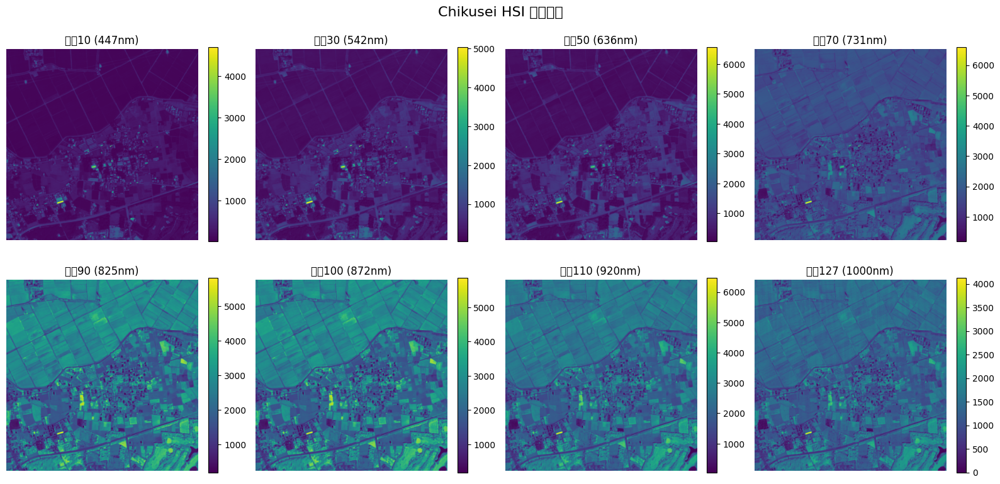

Blue: 范围[30.432117, 4822.068848], 均值=257.347687
Green: 范围[49.209412, 4839.483398], 均值=491.382904
Red: 范围[41.306076, 6543.733398], 均值=558.147339
Red_Edge: 范围[158.676117, 6657.184082], 均值=1250.838501
NIR: 范围[198.326599, 6001.208496], 均值=2451.042969


/tmp/ipykernel_2310666/1332090306.py:147: UserWarning: Glyph 29983 (\N{CJK UNIFIED IDEOGRAPH-751F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:147: UserWarning: Glyph 25104 (\N{CJK UNIFIED IDEOGRAPH-6210}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:147: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:147: UserWarning: Glyph 21709 (\N{CJK UNIFIED IDEOGRAPH-54CD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:147: UserWarning: Glyph 24212 (\N{CJK UNIFIED IDEOGRAPH-5E94}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 29983 (\N{CJK UNIFIED IDEOGRAPH-751F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **

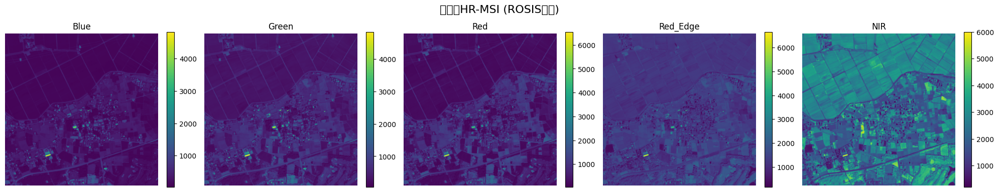

/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 20266 (\N{CJK UNIFIED IDEOGRAPH-4F2A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 24425 (\N{CJK UNIFIED IDEOGRAPH-5F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 33394 (\N{CJK UNIFIED IDEOGRAPH-8272}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 23545 (\N{CJK UNIFIED IDEOGRAPH-5BF9}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2310666/1332090306.py:203: UserWarning: Glyph 27604 (\N

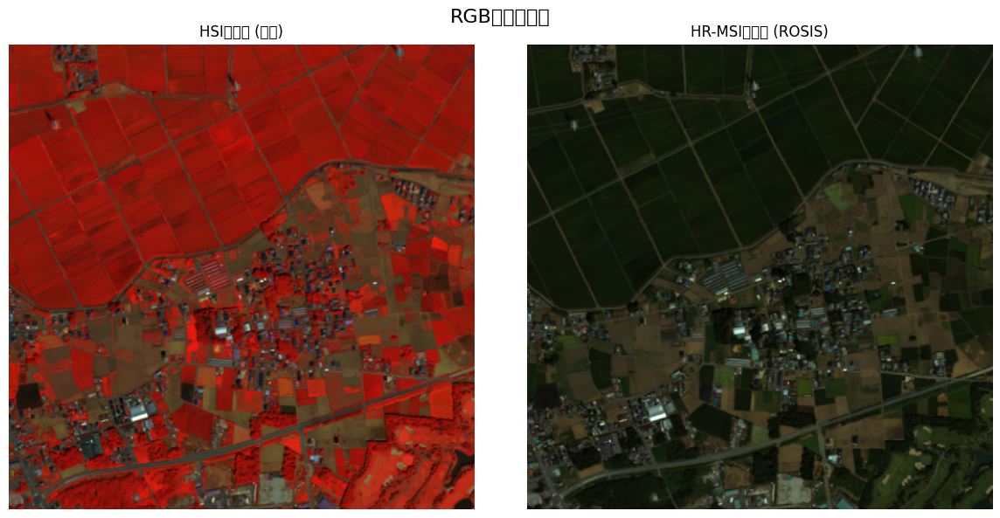

/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24378 (\N{CJK UNIFIED IDEOGRAPH-5F3A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20256 (\N{CJK UNIFIED IDEOGRAPH-4F20}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24863 (\N{CJK UNIFIED IDEOGRAPH-611F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtoo

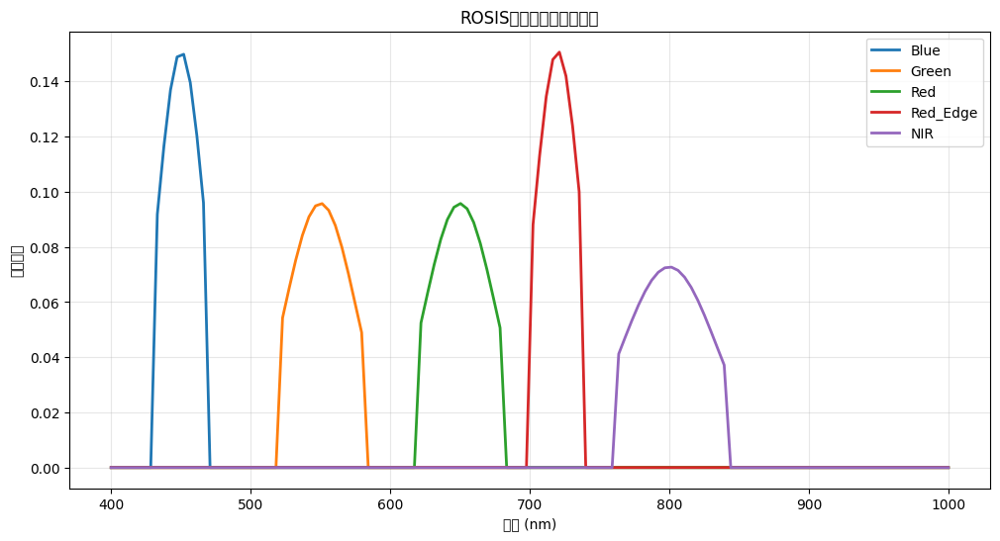


🎉 所有处理和可视化完成！
生成的HR-MSI包含以下波段: ['Blue', 'Green', 'Red', 'Red_Edge', 'NIR']
HR-MSI数据范围: [30.432117, 6657.184082]

📊 HR-MSI波段分析:
  Blue: 均值=257.347687, 标准差=242.726532
  Green: 均值=491.382904, 标准差=285.632629
  Red: 均值=558.147339, 标准差=416.015961
  Red_Edge: 均值=1250.838501, 标准差=307.383667
  NIR: 均值=2451.042969, 标准差=785.747681
🚀 开始Chikusei数据集的ROSIS处理（修复版本）...
🚀 开始使用ROSIS处理Chikusei数据集（稳健版本）...
=== 创建ROSIS传感器响应函数 ===
  生成 Blue 波段响应函数: 中心450nm, 带宽40nm
  生成 Green 波段响应函数: 中心550nm, 带宽60nm
  生成 Red 波段响应函数: 中心650nm, 带宽60nm
  生成 Red_Edge 波段响应函数: 中心720nm, 带宽40nm
  生成 NIR 波段响应函数: 中心800nm, 带宽80nm
✅ ROSIS响应函数创建完成: (5, 128)
=== 稳健加载Chikusei数据集 ===
文件路径: /data2/users/yujieliang/dataset/Chikusei/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729.mat
文件大小: 1.38 GB

方法1: 尝试使用scipy.io加载...
✗ scipy.io失败: Please use HDF reader for matlab v7.3 files, e.g. h5py

方法2: 使用h5py分步读取...
文件中的数据键: ['chikusei']
检查数据集 'chikusei': 形状=(128, 2335, 2517), 类型=float64
✓ 找到可能的高光谱数据: chikusei
检测到CHW格式: 128通道 × 2335×2517
开始分块读取数据...
分块

读取数据块: 100%|██████████| 10/10 [01:42<00:00, 10.28s/it]



✓ 数据读取完成
最终形状: (2335, 2517, 128) (HWC格式)
数据范围: [0.000000, 15133.000000]
数据范围: [0.000000, 15133.000000]
数据均值: 1181.498047

=== 开始处理数据 ===
成功加载HSI数据: 2335 × 2517 × 128 (HWC格式)
数据类型: float32
数据均值: 1181.498047

=== 开始处理数据 ===
成功加载HSI数据: 2335 × 2517 × 128 (HWC格式)
数据类型: float32
数据范围: [0.000000, 15133.000000]

应用ROSIS响应函数...
应用ROSIS响应函数:
  HSI数据形状: (2335, 2517, 128) (HWC)
  响应函数形状: (5, 128)
数据范围: [0.000000, 15133.000000]

应用ROSIS响应函数...
应用ROSIS响应函数:
  HSI数据形状: (2335, 2517, 128) (HWC)
  响应函数形状: (5, 128)
  处理波段 1/5: Blue
  处理波段 1/5: Blue


In [ ]:
# 首先定义缺失的ROSIS响应函数创建函数
import numpy as np
import matplotlib.pyplot as plt
import h5py
from tqdm import tqdm

def create_rosis_response_for_chikusei():
    """
    为Chikusei数据集创建ROSIS传感器响应函数
    """
    print("=== 创建ROSIS传感器响应函数 ===")
    
    # Chikusei数据集的波长范围：400-1000nm，128个波段
    chikusei_wavelengths = np.linspace(400, 1000, 128)
    
    # ROSIS传感器的5个波段定义
    rosis_bands = {
        'Blue': {
            'center': 450,      # 中心波长
            'bandwidth': 40,    # 带宽
            'range': (430, 470),
            'description': '蓝光波段'
        },
        'Green': {
            'center': 550,
            'bandwidth': 60,
            'range': (520, 580),
            'description': '绿光波段'
        },
        'Red': {
            'center': 650,
            'bandwidth': 60,
            'range': (620, 680),
            'description': '红光波段'
        },
        'Red_Edge': {
            'center': 720,
            'bandwidth': 40,
            'range': (700, 740),
            'description': '红边波段'
        },
        'NIR': {
            'center': 800,
            'bandwidth': 80,
            'range': (760, 840),
            'description': '近红外波段'
        }
    }
    
    # 生成每个波段的响应函数
    responses = []
    band_names = list(rosis_bands.keys())
    
    for band_name, band_info in rosis_bands.items():
        center = band_info['center']
        bandwidth = band_info['bandwidth']
        band_range = band_info['range']
        
        # 使用高斯函数建模响应
        response = np.zeros(128)
        sigma = bandwidth / (2 * np.sqrt(2 * np.log(2)))  # FWHM转标准差
        
        for i, wl in enumerate(chikusei_wavelengths):
            if band_range[0] <= wl <= band_range[1]:
                response[i] = np.exp(-0.5 * ((wl - center) / sigma) ** 2)
        
        # 归一化响应函数
        if np.sum(response) > 0:
            response = response / np.sum(response)
        
        responses.append(response)
        print(f"  生成 {band_name} 波段响应函数: 中心{center}nm, 带宽{bandwidth}nm")
    
    responses = np.array(responses)  # (5, 128)
    
    print(f"✅ ROSIS响应函数创建完成: {responses.shape}")
    return responses, chikusei_wavelengths, band_names, rosis_bands

def visualize_chikusei_rosis_results(h5_path):
    """
    可视化Chikusei ROSIS处理结果
    """
    print("=== 可视化Chikusei ROSIS处理结果 ===")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            # 读取数据
            gt_data = f['gt'][:]        # (C, H, W)
            hr_msi_data = f['HR_MSI'][:] # (5, H, W)
            band_names = [name.decode() if isinstance(name, bytes) else name 
                         for name in f['band_names'][:]]
            
            print(f"GT数据形状: {gt_data.shape}")
            print(f"HR-MSI数据形状: {hr_msi_data.shape}")
            print(f"波段名称: {band_names}")
            
            # 转换为HWC格式进行可视化
            gt_hwc = gt_data.transpose(1, 2, 0)      # (H, W, C)
            hr_msi_hwc = hr_msi_data.transpose(1, 2, 0)  # (H, W, 5)
            
            # 选择一个合理的区域进行显示（避免显示整个大图）
            h, w = gt_hwc.shape[:2]
            crop_size = 512
            center_h, center_w = h//2, w//2
            h_start = max(0, center_h - crop_size//2)
            h_end = min(h, center_h + crop_size//2)
            w_start = max(0, center_w - crop_size//2)
            w_end = min(w, center_w + crop_size//2)
            
            gt_crop = gt_hwc[h_start:h_end, w_start:w_end, :]
            hr_msi_crop = hr_msi_hwc[h_start:h_end, w_start:w_end, :]
            
            print(f"显示区域: {gt_crop.shape[:2]}")
            
            # 1. 显示HSI的几个典型波段
            fig, axes = plt.subplots(2, 4, figsize=(16, 8))
            fig.suptitle('Chikusei HSI 典型波段', fontsize=16)
            
            hsi_bands_to_show = [10, 30, 50, 70, 90, 100, 110, 127]
            wavelengths = np.linspace(400, 1000, 128)
            
            for i, band_idx in enumerate(hsi_bands_to_show):
                row, col = i // 4, i % 4
                if band_idx < gt_crop.shape[2]:
                    im = axes[row, col].imshow(gt_crop[:, :, band_idx], cmap='viridis')
                    axes[row, col].set_title(f'波段{band_idx} ({wavelengths[band_idx]:.0f}nm)')
                    axes[row, col].axis('off')
                    plt.colorbar(im, ax=axes[row, col], fraction=0.046)
            
            plt.tight_layout()
            plt.show()
            
            # 2. 显示生成的5个HR-MSI波段
            fig, axes = plt.subplots(1, 5, figsize=(20, 4))
            fig.suptitle('生成的HR-MSI (ROSIS响应)', fontsize=16)
            
            for i, band_name in enumerate(band_names):
                im = axes[i].imshow(hr_msi_crop[:, :, i], cmap='viridis')
                axes[i].set_title(f'{band_name}')
                axes[i].axis('off')
                plt.colorbar(im, ax=axes[i], fraction=0.046)
                
                # 显示统计信息
                band_data = hr_msi_crop[:, :, i]
                print(f"{band_name}: 范围[{band_data.min():.6f}, {band_data.max():.6f}], 均值={band_data.mean():.6f}")
            
            plt.tight_layout()
            plt.show()
            
            # 3. 创建伪彩色RGB图像（使用Red, Green, Blue波段）
            if len(band_names) >= 3:
                # 找到RGB波段的索引
                red_idx = band_names.index('Red') if 'Red' in band_names else 2
                green_idx = band_names.index('Green') if 'Green' in band_names else 1
                blue_idx = band_names.index('Blue') if 'Blue' in band_names else 0
                
                # 提取RGB通道
                red_channel = hr_msi_crop[:, :, red_idx]
                green_channel = hr_msi_crop[:, :, green_idx]
                blue_channel = hr_msi_crop[:, :, blue_idx]
                
                # 归一化到0-1范围
                def normalize_channel(channel):
                    min_val, max_val = channel.min(), channel.max()
                    if max_val > min_val:
                        return (channel - min_val) / (max_val - min_val)
                    return channel
                
                rgb_image = np.stack([
                    normalize_channel(red_channel),
                    normalize_channel(green_channel),
                    normalize_channel(blue_channel)
                ], axis=2)
                
                # 应用伽马校正
                gamma = 0.8
                rgb_image = np.power(rgb_image, gamma)
                
                # 显示RGB合成图像
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))
                
                # 原始HSI的RGB近似（使用相近波长的波段）
                hsi_red = gt_crop[:, :, 85]    # ~650nm
                hsi_green = gt_crop[:, :, 45]  # ~550nm  
                hsi_blue = gt_crop[:, :, 15]   # ~450nm
                
                hsi_rgb = np.stack([
                    normalize_channel(hsi_red),
                    normalize_channel(hsi_green),
                    normalize_channel(hsi_blue)
                ], axis=2)
                hsi_rgb = np.power(hsi_rgb, gamma)
                
                axes[0].imshow(hsi_rgb)
                axes[0].set_title('HSI伪彩色 (原始)')
                axes[0].axis('off')
                
                axes[1].imshow(rgb_image)
                axes[1].set_title('HR-MSI伪彩色 (ROSIS)')
                axes[1].axis('off')
                
                plt.suptitle('RGB伪彩色对比', fontsize=16)
                plt.tight_layout()
                plt.show()
            
            # 4. 分析光谱响应函数
            if 'rosis_responses' in f and 'wavelengths' in f:
                responses = f['rosis_responses'][:]
                wavelengths = f['wavelengths'][:]
                
                plt.figure(figsize=(12, 6))
                for i, band_name in enumerate(band_names):
                    plt.plot(wavelengths, responses[i], label=band_name, linewidth=2)
                
                plt.xlabel('波长 (nm)')
                plt.ylabel('响应强度')
                plt.title('ROSIS传感器光谱响应函数')
                plt.legend()
                plt.grid(True, alpha=0.3)
                plt.show()
            
            return gt_crop, hr_msi_crop, band_names
            
    except Exception as e:
        print(f"❌ 可视化失败: {e}")
        return None, None, None

# 现在执行完整的处理和可视化
print("🚀 开始执行完整的Chikusei ROSIS处理...")

# 首先运行处理函数
result = process_chikusei_with_rosis_robust()

if result[0] is not None:
    h5_path, gt_data, hr_msi_data, band_names = result
    print(f"\n✅ 处理完成！文件保存在: {h5_path}")
    
    # 可视化结果
    print(f"\n开始可视化结果...")
    gt_vis, hr_msi_vis, bands_vis = visualize_chikusei_rosis_results(h5_path)
    
    if gt_vis is not None:
        print(f"\n🎉 所有处理和可视化完成！")
        print(f"生成的HR-MSI包含以下波段: {bands_vis}")
        print(f"HR-MSI数据范围: [{hr_msi_vis.min():.6f}, {hr_msi_vis.max():.6f}]")
        
        # 额外的分析
        print(f"\n📊 HR-MSI波段分析:")
        for i, band_name in enumerate(bands_vis):
            band_data = hr_msi_vis[:, :, i]
            print(f"  {band_name}: 均值={band_data.mean():.6f}, 标准差={band_data.std():.6f}")
    else:
        print(f"\n❌ 可视化失败")
else:
    print(f"\n❌ 处理失败，请检查数据路径和文件完整性")
def load_chikusei_data_robust():
    """
    使用多种方法稳健地加载Chikusei数据集
    """
    
    print("=== 稳健加载Chikusei数据集 ===")
    
    # Chikusei主数据文件路径
    mat_path = '/data2/users/yujieliang/dataset/Chikusei/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729.mat'
    
    if not os.path.exists(mat_path):
        print(f"❌ 文件不存在: {mat_path}")
        return None, None
    
    file_size = os.path.getsize(mat_path) / (1024**3)
    print(f"文件路径: {mat_path}")
    print(f"文件大小: {file_size:.2f} GB")
    
    # 方法1: 尝试使用scipy.io（适用于较小的MATLAB文件）
    print("\n方法1: 尝试使用scipy.io加载...")
    try:
        mat_data = scipy.io.loadmat(mat_path)
        print("✓ scipy.io读取成功")
        
        # 查找高光谱数据
        data_keys = [key for key in mat_data.keys() if not key.startswith('__')]
        print(f"数据键: {data_keys}")
        
        for key in data_keys:
            data = mat_data[key]
            if isinstance(data, np.ndarray) and len(data.shape) == 3:
                print(f"找到3D数据: {key}, 形状={data.shape}")
                
                # 检查哪个维度最可能是通道维度
                if data.shape[0] > 50 and data.shape[0] < 200:  # 通道在第一维
                    c, h, w = data.shape
                    print(f"✓ 检测到CHW格式: {c}通道 × {h}×{w}")
                    # 转换为HWC格式
                    data_hwc = data.transpose(1, 2, 0)
                    print(f"转换为HWC格式: {data_hwc.shape}")
                    return data_hwc.astype(np.float32), key
                elif data.shape[2] > 50:  # 通道在第三维
                    h, w, c = data.shape
                    print(f"✓ 检测到HWC格式: {h}×{w} × {c}通道")
                    return data.astype(np.float32), key
        
        print("⚠️ scipy.io成功但未找到合适的高光谱数据")
        
    except Exception as e:
        print(f"✗ scipy.io失败: {e}")
    
    # 方法2: 尝试使用h5py的不同策略
    print("\n方法2: 使用h5py分步读取...")
    try:
        with h5py.File(mat_path, 'r') as f:
            print(f"文件中的数据键: {list(f.keys())}")
            
            # 遍历所有数据集
            for key in f.keys():
                dataset = f[key]
                if isinstance(dataset, h5py.Dataset):
                    print(f"检查数据集 '{key}': 形状={dataset.shape}, 类型={dataset.dtype}")
                    
                    # 查找3D数据且通道数合理的数据集
                    if len(dataset.shape) == 3:
                        print(f"✓ 找到可能的高光谱数据: {key}")
                        
                        # 判断数据格式并读取
                        if dataset.shape[0] > 50 and dataset.shape[0] < 200:  # CHW格式
                            c, h, w = dataset.shape
                            print(f"检测到CHW格式: {c}通道 × {h}×{w}")
                            print(f"开始分块读取数据...")
                            
                            # 创建输出数组（HWC格式）
                            full_data = np.zeros((h, w, c), dtype=np.float32)
                            
                            # 分块大小
                            chunk_size = 256
                            h_chunks = (h + chunk_size - 1) // chunk_size
                            w_chunks = (w + chunk_size - 1) // chunk_size
                            
                            print(f"分块参数: {chunk_size}×{chunk_size}, 总块数: {h_chunks}×{w_chunks}")
                            
                            # 分块读取
                            for hi in tqdm(range(h_chunks), desc="读取数据块"):
                                for wi in range(w_chunks):
                                    h_start = hi * chunk_size
                                    h_end = min(h_start + chunk_size, h)
                                    w_start = wi * chunk_size
                                    w_end = min(w_start + chunk_size, w)
                                    
                                    try:
                                        # 读取当前块（CHW格式）
                                        chunk_data = dataset[:, h_start:h_end, w_start:w_end]  # (C, H_chunk, W_chunk)
                                        # 转换为HWC格式
                                        chunk_hwc = chunk_data.transpose(1, 2, 0)  # (H_chunk, W_chunk, C)
                                        full_data[h_start:h_end, w_start:w_end, :] = chunk_hwc
                                    except Exception as chunk_error:
                                        print(f"✗ 读取块 [{hi},{wi}] 失败: {chunk_error}")
                                        continue
                            
                            print(f"✓ 数据读取完成")
                            print(f"最终形状: {full_data.shape} (HWC格式)")
                            print(f"数据范围: [{full_data.min():.6f}, {full_data.max():.6f}]")
                            print(f"数据均值: {full_data.mean():.6f}")
                            
                            return full_data, key
                        
                        elif dataset.shape[2] > 50:  # HWC格式
                            h, w, c = dataset.shape
                            print(f"检测到HWC格式: {h}×{w} × {c}通道")
                            # 直接读取
                            full_data = dataset[:].astype(np.float32)
                            return full_data, key
            
            print("⚠️ h5py成功但未找到合适的高光谱数据")
            
    except Exception as e:
        print(f"✗ h5py分块读取失败: {e}")
    
    # 方法3: 尝试使用h5py读取特定数据集名称
    print("\n方法3: 尝试读取可能的数据集名称...")
    possible_names = ['chikusei', 'data', 'hyperspectral', 'hsi', 'image', 'ref']
    
    try:
        with h5py.File(mat_path, 'r') as f:
            for name in possible_names:
                if name in f:
                    dataset = f[name]
                    print(f"尝试读取数据集: {name}, 形状={dataset.shape}")
                    
                    # 尝试读取小样本
                    try:
                        if len(dataset.shape) == 3:
                            if dataset.shape[0] > 50 and dataset.shape[0] < 200:  # CHW格式
                                sample = dataset[:, :10, :10]  # (C, 10, 10)
                                sample_hwc = sample.transpose(1, 2, 0)  # (10, 10, C)
                                print(f"✓ CHW格式样本读取成功: {sample_hwc.shape}")
                                
                                # 读取完整数据
                                c, h, w = dataset.shape
                                print(f"读取完整CHW数据: {c}×{h}×{w}")
                                full_data_chw = dataset[:]
                                full_data_hwc = full_data_chw.transpose(1, 2, 0)
                                return full_data_hwc.astype(np.float32), name
                                
                            elif dataset.shape[2] > 50:  # HWC格式
                                sample = dataset[:10, :10, :]
                                print(f"✓ HWC格式样本读取成功: {sample.shape}")
                                full_data = dataset[:]
                                return full_data.astype(np.float32), name
                    except Exception as sample_error:
                        print(f"✗ 数据集 {name} 读取失败: {sample_error}")
                        continue
    except Exception as e:
        print(f"✗ 特定名称读取失败: {e}")
    
    print("❌ 所有方法均失败，无法加载Chikusei数据")
    return None, None

def apply_rosis_to_chikusei_hsi(hsi_data, responses):
    """
    将ROSIS响应函数应用到Chikusei高光谱数据
    
    Args:
        hsi_data: Chikusei HSI数据 (H, W, 128) - HWC格式
        responses: ROSIS响应函数 (5, 128)
    
    Returns:
        hr_msi: HR-MSI数据 (H, W, 5)
    """
    
    h, w, c = hsi_data.shape
    num_bands = responses.shape[0]
    
    print(f"应用ROSIS响应函数:")
    print(f"  HSI数据形状: {hsi_data.shape} (HWC)")
    print(f"  响应函数形状: {responses.shape}")
    
    # 确保通道数匹配
    if c != responses.shape[1]:
        print(f"❌ 通道数不匹配: HSI有{c}个通道，响应函数需要{responses.shape[1]}个通道")
        return None
    
    # 应用光谱响应函数生成HR-MSI
    hr_msi = np.zeros((h, w, num_bands), dtype=np.float32)
    
    for i in range(num_bands):
        # 加权求和：每个多光谱波段 = Σ(HSI波段 × 对应响应权重)
        hr_msi[:, :, i] = np.sum(hsi_data * responses[i][None, None, :], axis=2)
        print(f"  处理波段 {i+1}/{num_bands}: {['Blue', 'Green', 'Red', 'Red_Edge', 'NIR'][i]}")
    
    return hr_msi

def process_chikusei_with_rosis_robust():
    """
    使用稳健方法处理Chikusei数据集，生成gt和HR-MSI的H5文件
    """
    
    print("🚀 开始使用ROSIS处理Chikusei数据集（稳健版本）...")
    
    # 1. 创建ROSIS响应函数
    responses, wavelengths, band_names, rosis_info = create_rosis_response_for_chikusei()
    
    # 2. 稳健加载Chikusei数据
    hsi_data, data_key = load_chikusei_data_robust()
    
    if hsi_data is None:
        print("❌ 无法加载Chikusei数据，处理终止")
        return None, None, None, None
    
    # 3. 获取数据尺寸信息
    h, w, c = hsi_data.shape
    print(f"\n=== 开始处理数据 ===")
    print(f"成功加载HSI数据: {h} × {w} × {c} (HWC格式)")
    print(f"数据类型: {hsi_data.dtype}")
    print(f"数据范围: [{hsi_data.min():.6f}, {hsi_data.max():.6f}]")
    
    # 检查通道数是否符合预期
    if c != 128:
        print(f"⚠️ 警告: 期望128个通道，实际{c}个通道")
        if c < 100:
            print("❌ 通道数太少，不符合Chikusei数据集特征")
            return None, None, None, None
    
    # 4. 处理数据
    print(f"\n应用ROSIS响应函数...")
    
    # 如果通道数不是128，调整响应函数
    if c != 128:
        print(f"调整响应函数以适配{c}个通道...")
        # 重新生成适配的响应函数
        chikusei_wavelengths = np.linspace(400, 1000, c)
        responses_adjusted = []
        
        for band_name, band_info in rosis_info.items():
            center = band_info['center']
            bandwidth = band_info['bandwidth']
            band_range = band_info['range']
            
            response = np.zeros(c)
            sigma = bandwidth / (2 * np.sqrt(2 * np.log(2)))
            
            for i, wl in enumerate(chikusei_wavelengths):
                if band_range[0] <= wl <= band_range[1]:
                    response[i] = np.exp(-0.5 * ((wl - center) / sigma) ** 2)
            
            if np.sum(response) > 0:
                response = response / np.sum(response)
            
            responses_adjusted.append(response)
        
        responses = np.array(responses_adjusted)
        wavelengths = chikusei_wavelengths
        print(f"调整后的响应函数形状: {responses.shape}")
    
    # 应用响应函数到整个数据
    hr_msi_full = apply_rosis_to_chikusei_hsi(hsi_data, responses)
    
    if hr_msi_full is None:
        print("❌ HR-MSI生成失败")
        return None, None, None, None
    
    print(f"✅ 处理完成!")
    print(f"生成的HR-MSI形状: {hr_msi_full.shape}")
    print(f"HR-MSI数据范围: [{hr_msi_full.min():.6f}, {hr_msi_full.max():.6f}]")
    
    # 5. 保存为H5文件
    output_path = "/data2/users/yujieliang/dataset/Chikusei_ROSIS.h5"
    
    print(f"\n=== 保存H5文件 ===")
    print(f"输出路径: {output_path}")
    
    with h5py.File(output_path, 'w') as f:
        # 保存gt（原始HSI）- 转换为CHW格式
        print("保存gt数据（原始HSI）...")
        gt_data = hsi_data.transpose(2, 0, 1).astype(np.float32)  # (C, H, W)
        f.create_dataset('gt', data=gt_data, compression='gzip', compression_opts=3)
        
        # 保存HR-MSI - 转换为CHW格式
        print("保存HR-MSI数据...")
        hr_msi_data = hr_msi_full.transpose(2, 0, 1).astype(np.float32)  # (5, H, W)
        f.create_dataset('HR_MSI', data=hr_msi_data, compression='gzip', compression_opts=3)
        
        # 保存ROSIS响应函数
        print("保存ROSIS响应函数...")
        f.create_dataset('rosis_responses', data=responses)
        f.create_dataset('wavelengths', data=wavelengths)
        
        # 保存波段名称
        dt = h5py.special_dtype(vlen=str)
        f.create_dataset('band_names', data=band_names, dtype=dt)
        
        # 保存元数据
        f.attrs['dataset_name'] = 'Chikusei'
        f.attrs['sensor_response'] = 'ROSIS'
        f.attrs['original_shape'] = (h, w, c)
        f.attrs['gt_shape'] = gt_data.shape
        f.attrs['hr_msi_shape'] = hr_msi_data.shape
        f.attrs['wavelength_range'] = '400-1000nm'
        f.attrs['spectral_resolution'] = f'{(1000-400)/c:.2f}nm'
        f.attrs['num_bands_hsi'] = c
        f.attrs['num_bands_msi'] = len(band_names)
        f.attrs['spatial_resolution'] = '2.5m'
        f.attrs['description'] = f'Chikusei dataset processed with ROSIS sensor response: gt=HSI({c}bands), HR_MSI=MSI(5bands)'
        f.attrs['source_data_key'] = data_key
        
        # 保存每个波段的详细信息
        for i, (band_name, band_info) in enumerate(rosis_info.items()):
            band_group = f.create_group(f'band_info/{band_name}')
            band_group.attrs['center_wavelength'] = band_info['center']
            band_group.attrs['bandwidth'] = band_info['bandwidth']
            band_group.attrs['wavelength_range'] = f"{band_info['range'][0]}-{band_info['range'][1]}nm"
            band_group.attrs['description'] = band_info['description']
    
    # 6. 验证保存的文件
    file_size_gb = os.path.getsize(output_path) / (1024**3)
    print(f"✅ 文件保存成功!")
    print(f"文件大小: {file_size_gb:.2f} GB")
    
    return output_path, gt_data, hr_msi_data, band_names

# 执行完整的处理流程
print("🚀 开始Chikusei数据集的ROSIS处理（修复版本）...")

# 处理数据并生成H5文件
result = process_chikusei_with_rosis_robust()

if result[0] is not None:
    h5_path, gt_data, hr_msi_data, band_names = result
    print(f"\n✅ 处理完成！文件保存在: {h5_path}")
    
    # 可视化结果
    print(f"\n开始可视化结果...")
    gt_vis, hr_msi_vis, bands_vis = visualize_chikusei_rosis_results(h5_path)
    
    print(f"\n🎉 所有处理完成！现在可以查看Chikusei的ROSIS HR-MSI效果了！")
    
else:
    print(f"\n❌ 处理失败，请检查数据路径和文件完整性")

🔍 开始详细分析 Chikusei_ROSIS.h5 文件...
📊 分析文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS.h5
📁 文件大小: 1.30 GB

🗂️ 文件结构:
主要数据集: ['HR_MSI', 'band_info', 'band_names', 'gt', 'rosis_responses', 'wavelengths']

📋 数据集详细信息:

📸 gt (高光谱真值):
  形状: (128, 2335, 2517)
  数据类型: float32
  压缩方式: gzip
  数据范围: [0.000000, 4291.000000]
  数据均值: 320.130585
  数据标准差: 650.392090
  数据格式: CHW (通道×高度×宽度)
  解释: 原始Chikusei高光谱数据，128个光谱通道

🌈 HR_MSI (生成的多光谱):
  形状: (5, 2335, 2517)
  数据类型: float32
  压缩方式: gzip
  数据范围: [0.000000, 4126.323730]
  数据均值: 285.297058
  数据标准差: 587.234192
  数据格式: CHW (通道×高度×宽度)
  解释: 使用ROSIS响应函数生成的5波段多光谱图像

🏷️ 波段名称:
  0: Blue
  1: Green
  2: Red
  3: Red_Edge
  4: NIR

📈 ROSIS响应函数:
  形状: (5, 128)
  数据类型: float64
  解释: 每行代表一个多光谱波段对128个高光谱波段的响应权重
  Blue: 权重和=1.0000, 最大响应@452nm
  Green: 权重和=1.0000, 最大响应@550nm
  Red: 权重和=1.0000, 最大响应@648nm
  Red_Edge: 权重和=1.0000, 最大响应@719nm
  NIR: 权重和=1.0000, 最大响应@798nm

📏 波长信息:
  形状: (128,)
  范围: 400 - 1000 nm
  间隔: 4.69 nm

📝 元数据属性:
  dataset_name: Chikusei
  descrip

/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 21508 (\N{CJK UNIFIED IDEOGRAPH-5404}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 20256 (\N{CJK UNIFIED IDEOGRAPH-4F20}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 24863 (\N{CJK UNIFIED IDEOGRAPH-611F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 22120 (\N{CJK UNIFIED IDEOGRAPH-5668}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:207: UserWarning: Glyph 21709 (\N

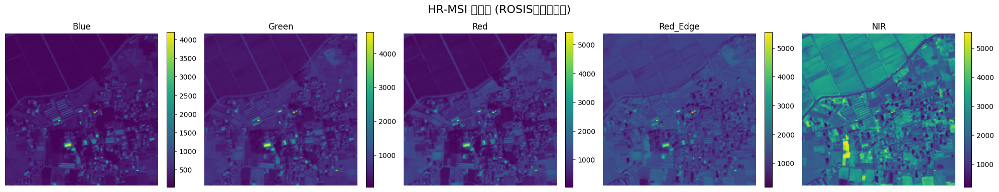

/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 20856 (\N{CJK UNIFIED IDEOGRAPH-5178}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 22411 (\N{CJK UNIFIED IDEOGRAPH-578B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:226: UserWarning: Glyph 39640 (\N

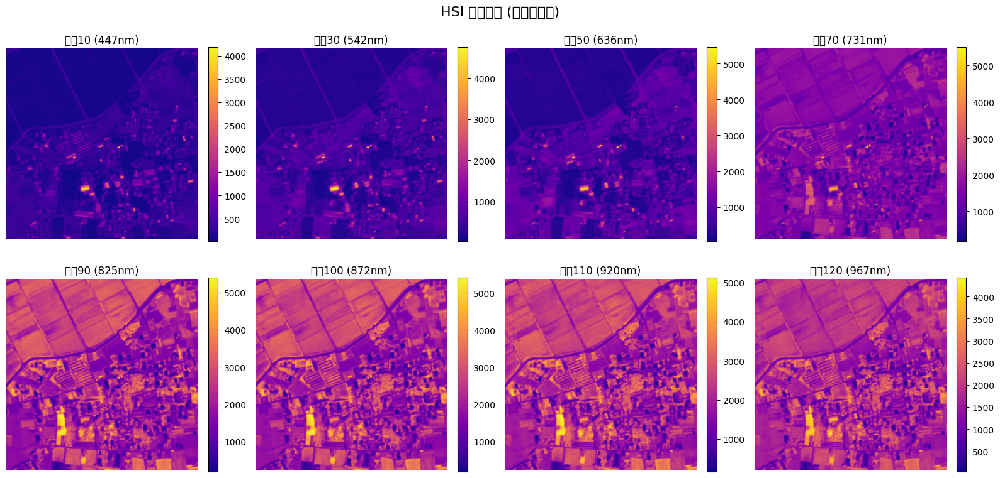

/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 20266 (\N{CJK UNIFIED IDEOGRAPH-4F2A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 24425 (\N{CJK UNIFIED IDEOGRAPH-5F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 33394 (\N{CJK UNIFIED IDEOGRAPH-8272}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 39640 (\N{CJK UNIFIED IDEOGRAPH-9AD8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/2384474610.py:275: UserWarning: Glyph 20809 (\N

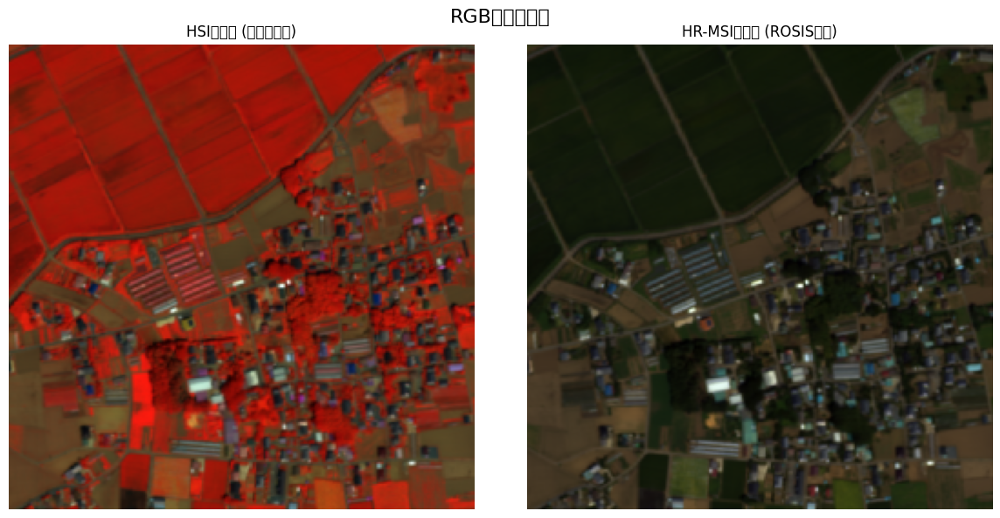

/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24378 (\N{CJK UNIFIED IDEOGRAPH-5F3A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20989 (\N{CJK UNIFIED IDEOGRAPH-51FD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtoo

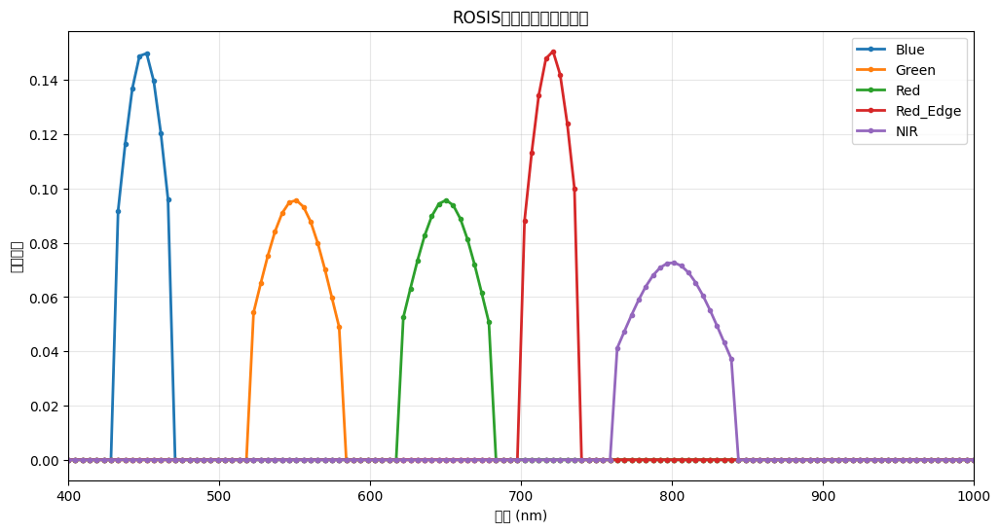


📋 总结:
✅ 这是一个完整的Chikusei数据集，经过ROSIS传感器响应处理
✅ 包含原始128波段高光谱数据(gt)和5波段多光谱数据(HR_MSI)
✅ 数据格式标准，适合用于多图像融合研究
✅ 包含完整的波段信息和光谱响应函数
💡 可以直接用于深度学习模型训练！


In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

def analyze_chikusei_rosis_h5(h5_path):
    """详细分析Chikusei ROSIS H5文件的内容"""
    
    print("=" * 60)
    print(f"📊 分析文件: {h5_path}")
    print("=" * 60)
    
    # 检查文件是否存在
    import os
    if not os.path.exists(h5_path):
        print(f"❌ 文件不存在: {h5_path}")
        return
    
    # 文件基本信息
    file_size_gb = os.path.getsize(h5_path) / (1024**3)
    print(f"📁 文件大小: {file_size_gb:.2f} GB")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            
            # 1. 显示文件结构
            print(f"\n🗂️ 文件结构:")
            print(f"主要数据集: {list(f.keys())}")
            
            # 2. 详细分析每个数据集
            print(f"\n📋 数据集详细信息:")
            
            # GT数据 (高光谱真值)
            if 'gt' in f:
                gt = f['gt']
                print(f"\n📸 gt (高光谱真值):")
                print(f"  形状: {gt.shape}")
                print(f"  数据类型: {gt.dtype}")
                print(f"  压缩方式: {gt.compression}")
                
                # 读取一小块数据进行分析
                sample_data = gt[:, :100, :100]
                print(f"  数据范围: [{sample_data.min():.6f}, {sample_data.max():.6f}]")
                print(f"  数据均值: {sample_data.mean():.6f}")
                print(f"  数据标准差: {sample_data.std():.6f}")
                print(f"  数据格式: CHW (通道×高度×宽度)")
                print(f"  解释: 原始Chikusei高光谱数据，{gt.shape[0]}个光谱通道")
            
            # HR_MSI数据 (生成的多光谱)
            if 'HR_MSI' in f:
                hr_msi = f['HR_MSI']
                print(f"\n🌈 HR_MSI (生成的多光谱):")
                print(f"  形状: {hr_msi.shape}")
                print(f"  数据类型: {hr_msi.dtype}")
                print(f"  压缩方式: {hr_msi.compression}")
                
                sample_data = hr_msi[:, :100, :100]
                print(f"  数据范围: [{sample_data.min():.6f}, {sample_data.max():.6f}]")
                print(f"  数据均值: {sample_data.mean():.6f}")
                print(f"  数据标准差: {sample_data.std():.6f}")
                print(f"  数据格式: CHW (通道×高度×宽度)")
                print(f"  解释: 使用ROSIS响应函数生成的{hr_msi.shape[0]}波段多光谱图像")
            
            # 波段名称
            if 'band_names' in f:
                band_names = f['band_names'][:]
                band_names_decoded = [name.decode() if isinstance(name, bytes) else name for name in band_names]
                print(f"\n🏷️ 波段名称:")
                for i, name in enumerate(band_names_decoded):
                    print(f"  {i}: {name}")
            
            # ROSIS响应函数
            if 'rosis_responses' in f:
                responses = f['rosis_responses']
                print(f"\n📈 ROSIS响应函数:")
                print(f"  形状: {responses.shape}")
                print(f"  数据类型: {responses.dtype}")
                print(f"  解释: 每行代表一个多光谱波段对128个高光谱波段的响应权重")
                
                # 显示每个波段的响应统计
                for i, band_name in enumerate(band_names_decoded):
                    response_sum = responses[i, :].sum()
                    response_max = responses[i, :].max()
                    max_idx = np.argmax(responses[i, :])
                    wavelength_at_max = 400 + max_idx * (1000-400) / 128
                    print(f"  {band_name}: 权重和={response_sum:.4f}, 最大响应@{wavelength_at_max:.0f}nm")
            
            # 波长信息
            if 'wavelengths' in f:
                wavelengths = f['wavelengths']
                print(f"\n📏 波长信息:")
                print(f"  形状: {wavelengths.shape}")
                print(f"  范围: {wavelengths[:].min():.0f} - {wavelengths[:].max():.0f} nm")
                print(f"  间隔: {(wavelengths[:].max() - wavelengths[:].min()) / len(wavelengths[:]):.2f} nm")
            
            # 元数据属性
            print(f"\n📝 元数据属性:")
            for attr_name, attr_value in f.attrs.items():
                print(f"  {attr_name}: {attr_value}")
            
            # 波段详细信息
            if 'band_info' in f:
                print(f"\n🔬 波段详细信息:")
                band_info_group = f['band_info']
                for band_name in band_info_group.keys():
                    band_group = band_info_group[band_name]
                    print(f"  {band_name}:")
                    for attr_name, attr_value in band_group.attrs.items():
                        print(f"    {attr_name}: {attr_value}")
            
            # 3. 数据质量分析
            print(f"\n🔍 数据质量分析:")
            
            if 'gt' in f and 'HR_MSI' in f:
                gt_data = f['gt']
                hr_msi_data = f['HR_MSI']
                
                # 检查空间尺寸一致性
                gt_spatial = gt_data.shape[1:]  # (H, W)
                hr_msi_spatial = hr_msi_data.shape[1:]  # (H, W)
                
                print(f"  空间尺寸一致性:")
                print(f"    GT: {gt_spatial}")
                print(f"    HR_MSI: {hr_msi_spatial}")
                print(f"    ✓ 一致" if gt_spatial == hr_msi_spatial else "    ❌ 不一致")
                
                # 检查数据有效性
                gt_sample = gt_data[:, :100, :100]
                hr_msi_sample = hr_msi_data[:, :100, :100]
                
                print(f"  数据有效性:")
                print(f"    GT: 无NaN({not np.any(np.isnan(gt_sample))}), 无Inf({not np.any(np.isinf(gt_sample))})")
                print(f"    HR_MSI: 无NaN({not np.any(np.isnan(hr_msi_sample))}), 无Inf({not np.any(np.isinf(hr_msi_sample))})")
                
                # 数据动态范围
                print(f"  数据动态范围:")
                print(f"    GT: [{gt_sample.min():.6f}, {gt_sample.max():.6f}]")
                print(f"    HR_MSI: [{hr_msi_sample.min():.6f}, {hr_msi_sample.max():.6f}]")
            
            # 4. 存储效率分析
            print(f"\n💾 存储效率:")
            total_elements = 0
            compressed_size = 0
            
            for key in ['gt', 'HR_MSI']:
                if key in f:
                    dataset = f[key]
                    elements = np.prod(dataset.shape)
                    size_uncompressed = elements * 4  # float32 = 4 bytes
                    total_elements += elements
                    compressed_size += size_uncompressed  # 近似值
                    
                    print(f"  {key}: {elements:,} 元素, ~{size_uncompressed/1024**2:.1f} MB 未压缩")
            
            compression_ratio = compressed_size / (file_size_gb * 1024**3)
            print(f"  压缩比: ~{compression_ratio:.1f}:1")
            
        return True
        
    except Exception as e:
        print(f"❌ 读取文件失败: {e}")
        return False

def visualize_chikusei_rosis_samples(h5_path, num_samples=5):
    """可视化Chikusei ROSIS数据的样本"""
    
    print(f"\n🎨 可视化数据样本...")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            gt_data = f['gt'][:]
            hr_msi_data = f['HR_MSI'][:]
            band_names = [name.decode() if isinstance(name, bytes) else name 
                         for name in f['band_names'][:]]
            
            # 转换为HWC格式便于可视化
            gt_hwc = gt_data.transpose(1, 2, 0)  # (H, W, C)
            hr_msi_hwc = hr_msi_data.transpose(1, 2, 0)  # (H, W, 5)
            
            # 选择中心区域进行显示
            h, w = gt_hwc.shape[:2]
            crop_size = 256
            center_h, center_w = h//2, w//2
            h_start = max(0, center_h - crop_size//2)
            h_end = min(h, center_h + crop_size//2)
            w_start = max(0, center_w - crop_size//2)
            w_end = min(w, center_w + crop_size//2)
            
            gt_crop = gt_hwc[h_start:h_end, w_start:w_end, :]
            hr_msi_crop = hr_msi_hwc[h_start:h_end, w_start:w_end, :]
            
            print(f"显示区域: {gt_crop.shape[:2]}")
            
            # 1. 显示HR-MSI的5个波段
            fig, axes = plt.subplots(1, 5, figsize=(20, 4))
            fig.suptitle('HR-MSI 各波段 (ROSIS传感器响应)', fontsize=16)
            
            for i, band_name in enumerate(band_names):
                im = axes[i].imshow(hr_msi_crop[:, :, i], cmap='viridis')
                axes[i].set_title(f'{band_name}')
                axes[i].axis('off')
                plt.colorbar(im, ax=axes[i], fraction=0.046)
                
                # 显示统计信息
                band_data = hr_msi_crop[:, :, i]
                print(f"{band_name}: 范围[{band_data.min():.6f}, {band_data.max():.6f}], 均值={band_data.mean():.6f}")
            
            plt.tight_layout()
            plt.show()
            
            # 2. 显示HSI的典型波段
            fig, axes = plt.subplots(2, 4, figsize=(16, 8))
            fig.suptitle('HSI 典型波段 (原始高光谱)', fontsize=16)
            
            # 选择有代表性的波段
            wavelengths = np.linspace(400, 1000, gt_crop.shape[2])
            representative_bands = [10, 30, 50, 70, 90, 100, 110, 120]
            
            for i, band_idx in enumerate(representative_bands):
                row, col = i // 4, i % 4
                if band_idx < gt_crop.shape[2]:
                    im = axes[row, col].imshow(gt_crop[:, :, band_idx], cmap='plasma')
                    axes[row, col].set_title(f'波段{band_idx} ({wavelengths[band_idx]:.0f}nm)')
                    axes[row, col].axis('off')
                    plt.colorbar(im, ax=axes[row, col], fraction=0.046)
            
            plt.tight_layout()
            plt.show()
            
            # 3. RGB合成对比
            if len(band_names) >= 3:
                red_idx = band_names.index('Red') if 'Red' in band_names else 2
                green_idx = band_names.index('Green') if 'Green' in band_names else 1
                blue_idx = band_names.index('Blue') if 'Blue' in band_names else 0
                
                def normalize_channel(channel):
                    min_val, max_val = channel.min(), channel.max()
                    if max_val > min_val:
                        return (channel - min_val) / (max_val - min_val)
                    return channel
                
                # HR-MSI RGB合成
                hr_msi_rgb = np.stack([
                    normalize_channel(hr_msi_crop[:, :, red_idx]),
                    normalize_channel(hr_msi_crop[:, :, green_idx]),
                    normalize_channel(hr_msi_crop[:, :, blue_idx])
                ], axis=2)
                
                # HSI RGB近似
                hsi_red = gt_crop[:, :, 85]    # ~650nm
                hsi_green = gt_crop[:, :, 45]  # ~550nm  
                hsi_blue = gt_crop[:, :, 15]   # ~450nm
                
                hsi_rgb = np.stack([
                    normalize_channel(hsi_red),
                    normalize_channel(hsi_green),
                    normalize_channel(hsi_blue)
                ], axis=2)
                
                # 应用伽马校正
                gamma = 0.8
                hr_msi_rgb = np.power(hr_msi_rgb, gamma)
                hsi_rgb = np.power(hsi_rgb, gamma)
                
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))
                
                axes[0].imshow(hsi_rgb)
                axes[0].set_title('HSI伪彩色 (原始高光谱)')
                axes[0].axis('off')
                
                axes[1].imshow(hr_msi_rgb)
                axes[1].set_title('HR-MSI伪彩色 (ROSIS响应)')
                axes[1].axis('off')
                
                plt.suptitle('RGB伪彩色对比', fontsize=16)
                plt.tight_layout()
                plt.show()
            
            # 4. 光谱响应函数可视化
            if 'rosis_responses' in f and 'wavelengths' in f:
                responses = f['rosis_responses'][:]
                wavelengths_resp = f['wavelengths'][:]
                
                plt.figure(figsize=(12, 6))
                for i, band_name in enumerate(band_names):
                    plt.plot(wavelengths_resp, responses[i], label=band_name, linewidth=2, marker='o', markersize=3)
                
                plt.xlabel('波长 (nm)')
                plt.ylabel('响应强度')
                plt.title('ROSIS传感器光谱响应函数')
                plt.legend()
                plt.grid(True, alpha=0.3)
                plt.xlim(400, 1000)
                plt.show()
            
    except Exception as e:
        print(f"❌ 可视化失败: {e}")

# 执行分析
h5_path = "/data2/users/yujieliang/dataset/Chikusei_ROSIS.h5"

print("🔍 开始详细分析 Chikusei_ROSIS.h5 文件...")
success = analyze_chikusei_rosis_h5(h5_path)

if success:
    print(f"\n" + "="*60)
    print("🎨 开始可视化数据...")
    visualize_chikusei_rosis_samples(h5_path)
    
    print(f"\n" + "="*60)
    print("📋 总结:")
    print("✅ 这是一个完整的Chikusei数据集，经过ROSIS传感器响应处理")
    print("✅ 包含原始128波段高光谱数据(gt)和5波段多光谱数据(HR_MSI)")
    print("✅ 数据格式标准，适合用于多图像融合研究")
    print("✅ 包含完整的波段信息和光谱响应函数")
    print("💡 可以直接用于深度学习模型训练！")
else:
    print("❌ 文件分析失败")

🚀 开始修改Chikusei_ROSIS.h5文件...
🔧 开始修改Chikusei_ROSIS.h5文件...
输入文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS.h5
输出文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS_RGB.h5

📋 原始数据信息:
GT形状: (128, 2335, 2517)
HR_MSI形状: (5, 2335, 2517)
原始波段名称: ['Blue', 'Green', 'Red', 'Red_Edge', 'NIR']

🎯 找到RGB波段索引:
  Blue: 索引 0
  Green: 索引 1
  Red: 索引 2

✅ 提取RGB数据:
新HRMSI形状: (3, 2335, 2517)
新波段顺序: ['Red', 'Green', 'Blue']
数据范围: [0.000000, 10391.035156]

💾 保存数据到新文件...
  保存gt数据...

📋 原始数据信息:
GT形状: (128, 2335, 2517)
HR_MSI形状: (5, 2335, 2517)
原始波段名称: ['Blue', 'Green', 'Red', 'Red_Edge', 'NIR']

🎯 找到RGB波段索引:
  Blue: 索引 0
  Green: 索引 1
  Red: 索引 2

✅ 提取RGB数据:
新HRMSI形状: (3, 2335, 2517)
新波段顺序: ['Red', 'Green', 'Blue']
数据范围: [0.000000, 10391.035156]

💾 保存数据到新文件...
  保存gt数据...
  保存HRMSI数据（RGB波段）...
  保存HRMSI数据（RGB波段）...
  保存波段名称...
  保存rosis_responses（仅RGB波段）...
  复制wavelengths...
  更新元数据...
  更新波段详细信息...

✅ 文件修改完成！

🔍 验证修改后的文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS_RGB.h5
文件大小: 1.26 GB

📂 文件结构:
数据集: [

/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 21512 (\N{CJK UNIFIED IDEOGRAPH-5408}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 25104 (\N{CJK UNIFIED IDEOGRAPH-6210}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 20462 (\N{CJK UNIFIED IDEOGRAPH-4FEE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 25913 (\N{CJK UNIFIED IDEOGRAPH-6539}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2446281/1452253642.py:285: UserWarning: Glyph 21518 (\N

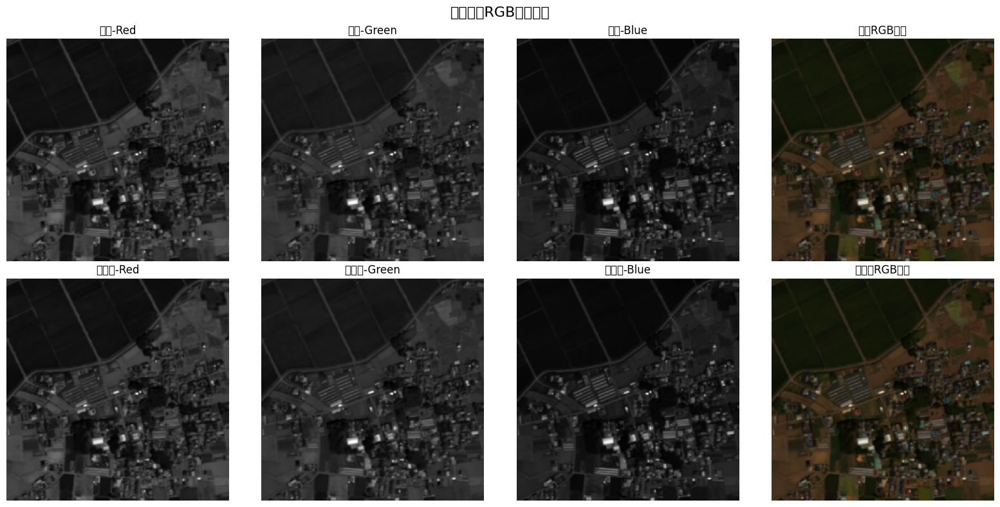


🔍 数据一致性检查:
  Red通道最大差值: 0.00000000
    ✅ Red通道数据一致
  Green通道最大差值: 0.00000000
    ✅ Green通道数据一致
  Blue通道最大差值: 0.00000000
    ✅ Blue通道数据一致

📋 修改总结:
✅ 原始文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS.h5
✅ 修改后文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS_RGB.h5
✅ 数据变化:
   • HR_MSI (5波段) → HRMSI (3波段RGB)
   • 波段顺序: Blue,Green,Red,Red_Edge,NIR → Red,Green,Blue
   • 键名变化: HR_MSI → HRMSI
✅ gt数据保持不变 (128波段高光谱)
✅ 文件已准备好用于深度学习训练！


In [2]:
import h5py
import numpy as np

def modify_chikusei_rosis_h5():
    """
    修改Chikusei_ROSIS.h5文件:
    1. 从HR_MSI中提取blue, green, red波段
    2. 按照red, green, blue的顺序重新排列
    3. 将HR_MSI键名改为HRMSI
    """
    
    input_path = "/data2/users/yujieliang/dataset/Chikusei_ROSIS.h5"
    output_path = "/data2/users/yujieliang/dataset/Chikusei_ROSIS_RGB.h5"
    
    print("🔧 开始修改Chikusei_ROSIS.h5文件...")
    print(f"输入文件: {input_path}")
    print(f"输出文件: {output_path}")
    
    try:
        with h5py.File(input_path, 'r') as f_in:
            # 读取原始数据
            gt_data = f_in['gt'][:]  # (128, H, W)
            hr_msi_data = f_in['HR_MSI'][:]  # (5, H, W)
            band_names = [name.decode() if isinstance(name, bytes) else name 
                         for name in f_in['band_names'][:]]
            
            print(f"\n📋 原始数据信息:")
            print(f"GT形状: {gt_data.shape}")
            print(f"HR_MSI形状: {hr_msi_data.shape}")
            print(f"原始波段名称: {band_names}")
            
            # 找到RGB波段的索引
            try:
                blue_idx = band_names.index('Blue')
                green_idx = band_names.index('Green') 
                red_idx = band_names.index('Red')
                print(f"\n🎯 找到RGB波段索引:")
                print(f"  Blue: 索引 {blue_idx}")
                print(f"  Green: 索引 {green_idx}")
                print(f"  Red: 索引 {red_idx}")
            except ValueError as e:
                print(f"❌ 找不到RGB波段: {e}")
                return False
            
            # 按照red, green, blue的顺序提取数据
            rgb_indices = [red_idx, green_idx, blue_idx]
            rgb_data = hr_msi_data[rgb_indices, :, :]  # (3, H, W)
            rgb_band_names = ['Red', 'Green', 'Blue']
            
            print(f"\n✅ 提取RGB数据:")
            print(f"新HRMSI形状: {rgb_data.shape}")
            print(f"新波段顺序: {rgb_band_names}")
            print(f"数据范围: [{rgb_data.min():.6f}, {rgb_data.max():.6f}]")
            
            # 创建新的H5文件
            with h5py.File(output_path, 'w') as f_out:
                
                # 1. 保存gt数据（不变）
                print(f"\n💾 保存数据到新文件...")
                print("  保存gt数据...")
                f_out.create_dataset('gt', data=gt_data, compression='gzip', compression_opts=3)
                
                # 2. 保存HRMSI数据（新键名，RGB顺序）
                print("  保存HRMSI数据（RGB波段）...")
                f_out.create_dataset('HRMSI', data=rgb_data, compression='gzip', compression_opts=3)
                
                # 3. 保存RGB波段名称
                print("  保存波段名称...")
                dt = h5py.special_dtype(vlen=str)
                f_out.create_dataset('band_names', data=rgb_band_names, dtype=dt)
                
                # 4. 复制其他相关数据（如果存在）
                datasets_to_copy = ['rosis_responses', 'wavelengths']
                for dataset_name in datasets_to_copy:
                    if dataset_name in f_in:
                        if dataset_name == 'rosis_responses':
                            # 只复制RGB对应的响应函数
                            original_responses = f_in[dataset_name][:]
                            rgb_responses = original_responses[rgb_indices, :]
                            f_out.create_dataset(dataset_name, data=rgb_responses)
                            print(f"  保存{dataset_name}（仅RGB波段）...")
                        else:
                            f_out.create_dataset(dataset_name, data=f_in[dataset_name][:])
                            print(f"  复制{dataset_name}...")
                
                # 5. 更新元数据属性
                print("  更新元数据...")
                # 复制原有属性
                for attr_name, attr_value in f_in.attrs.items():
                    f_out.attrs[attr_name] = attr_value
                
                # 更新特定属性
                f_out.attrs['hrmsi_shape'] = rgb_data.shape
                f_out.attrs['num_bands_msi'] = 3
                f_out.attrs['msi_bands'] = 'Red, Green, Blue (in order)'
                f_out.attrs['description'] = 'Chikusei dataset with ROSIS response: gt=HSI(128bands), HRMSI=RGB(3bands in R-G-B order)'
                f_out.attrs['modification_date'] = '2025-08-10'
                f_out.attrs['modification_note'] = 'Extracted RGB bands from HR_MSI, renamed to HRMSI'
                
                # 删除旧的HR_MSI相关属性（如果存在）
                if 'hr_msi_shape' in f_out.attrs:
                    del f_out.attrs['hr_msi_shape']
                
                # 6. 保存RGB波段的详细信息
                if 'band_info' in f_in:
                    print("  更新波段详细信息...")
                    band_info_group_in = f_in['band_info']
                    band_info_group_out = f_out.create_group('band_info')
                    
                    # 只复制RGB波段的信息
                    rgb_band_keys = ['Red', 'Green', 'Blue']
                    for band_key in rgb_band_keys:
                        if band_key in band_info_group_in:
                            band_group_in = band_info_group_in[band_key]
                            band_group_out = band_info_group_out.create_group(band_key)
                            
                            # 复制所有属性
                            for attr_name, attr_value in band_group_in.attrs.items():
                                band_group_out.attrs[attr_name] = attr_value
        
        # 验证新文件
        print(f"\n✅ 文件修改完成！")
        verify_modified_file(output_path)
        return True
        
    except Exception as e:
        print(f"❌ 修改文件时出错: {e}")
        return False

def verify_modified_file(h5_path):
    """验证修改后的文件"""
    
    print(f"\n🔍 验证修改后的文件: {h5_path}")
    
    try:
        import os
        file_size_gb = os.path.getsize(h5_path) / (1024**3)
        print(f"文件大小: {file_size_gb:.2f} GB")
        
        with h5py.File(h5_path, 'r') as f:
            print(f"\n📂 文件结构:")
            print(f"数据集: {list(f.keys())}")
            
            # 检查gt数据
            if 'gt' in f:
                gt = f['gt']
                print(f"\n📸 gt (高光谱真值):")
                print(f"  形状: {gt.shape}")
                print(f"  数据类型: {gt.dtype}")
                print(f"  数据范围: [{gt[:, :100, :100].min():.6f}, {gt[:, :100, :100].max():.6f}]")
            
            # 检查HRMSI数据
            if 'HRMSI' in f:
                hrmsi = f['HRMSI']
                print(f"\n🌈 HRMSI (RGB多光谱):")
                print(f"  形状: {hrmsi.shape}")
                print(f"  数据类型: {hrmsi.dtype}")
                print(f"  数据范围: [{hrmsi[:, :100, :100].min():.6f}, {hrmsi[:, :100, :100].max():.6f}]")
                print(f"  解释: RGB波段按R-G-B顺序排列")
            
            # 检查波段名称
            if 'band_names' in f:
                band_names = [name.decode() if isinstance(name, bytes) else name 
                             for name in f['band_names'][:]]
                print(f"\n🏷️ 波段名称: {band_names}")
                
                # 验证顺序
                expected_order = ['Red', 'Green', 'Blue']
                if band_names == expected_order:
                    print(f"  ✅ 波段顺序正确: R-G-B")
                else:
                    print(f"  ⚠️ 波段顺序异常，期望: {expected_order}")
            
            # 检查响应函数
            if 'rosis_responses' in f:
                responses = f['rosis_responses']
                print(f"\n📈 ROSIS响应函数:")
                print(f"  形状: {responses.shape} (应该是 3×128)")
                if responses.shape[0] == 3:
                    print(f"  ✅ RGB响应函数提取正确")
                else:
                    print(f"  ⚠️ 响应函数数量异常")
            
            # 检查元数据
            print(f"\n📝 关键元数据:")
            key_attrs = ['hrmsi_shape', 'num_bands_msi', 'msi_bands', 'description']
            for attr in key_attrs:
                if attr in f.attrs:
                    print(f"  {attr}: {f.attrs[attr]}")
        
        print(f"\n✅ 文件验证完成！")
        return True
        
    except Exception as e:
        print(f"❌ 验证文件时出错: {e}")
        return False

def visualize_rgb_comparison():
    """可视化修改前后的对比"""
    
    original_path = "/data2/users/yujieliang/dataset/Chikusei_ROSIS.h5"
    modified_path = "/data2/users/yujieliang/dataset/Chikusei_ROSIS_RGB.h5"
    
    print(f"\n🎨 可视化修改前后的对比...")
    
    try:
        import matplotlib.pyplot as plt
        
        # 读取原始文件
        with h5py.File(original_path, 'r') as f_orig:
            hr_msi_orig = f_orig['HR_MSI'][:]  # (5, H, W)
            band_names_orig = [name.decode() if isinstance(name, bytes) else name 
                              for name in f_orig['band_names'][:]]
        
        # 读取修改后文件
        with h5py.File(modified_path, 'r') as f_mod:
            hrmsi_mod = f_mod['HRMSI'][:]  # (3, H, W)
            band_names_mod = [name.decode() if isinstance(name, bytes) else name 
                             for name in f_mod['band_names'][:]]
        
        print(f"原始HR_MSI波段: {band_names_orig}")
        print(f"修改后HRMSI波段: {band_names_mod}")
        
        # 选择显示区域
        h, w = hr_msi_orig.shape[1:]
        crop_size = 256
        center_h, center_w = h//2, w//2
        h_start = max(0, center_h - crop_size//2)
        h_end = min(h, center_h + crop_size//2)
        w_start = max(0, center_w - crop_size//2)
        w_end = min(w, center_w + crop_size//2)
        
        # 提取RGB数据进行对比
        # 原始文件中的RGB
        blue_idx = band_names_orig.index('Blue')
        green_idx = band_names_orig.index('Green')
        red_idx = band_names_orig.index('Red')
        
        orig_rgb = np.stack([
            hr_msi_orig[red_idx, h_start:h_end, w_start:w_end],
            hr_msi_orig[green_idx, h_start:h_end, w_start:w_end],
            hr_msi_orig[blue_idx, h_start:h_end, w_start:w_end]
        ], axis=2)
        
        # 修改后文件中的RGB（已经是R-G-B顺序）
        mod_rgb = hrmsi_mod[:, h_start:h_end, w_start:w_end].transpose(1, 2, 0)
        
        # 归一化用于显示
        def normalize_for_display(data):
            data_norm = data - data.min()
            data_max = data_norm.max()
            if data_max > 0:
                data_norm = data_norm / data_max
            return np.power(data_norm, 0.8)  # 伽马校正
        
        orig_rgb_display = normalize_for_display(orig_rgb)
        mod_rgb_display = normalize_for_display(mod_rgb)
        
        # 可视化对比
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle('修改前后RGB波段对比', fontsize=16)
        
        # 显示各个通道
        channels = ['Red', 'Green', 'Blue']
        for i, channel in enumerate(channels):
            # 原始数据
            axes[0, i].imshow(orig_rgb_display[:, :, i], cmap='gray')
            axes[0, i].set_title(f'原始-{channel}')
            axes[0, i].axis('off')
            
            # 修改后数据
            axes[1, i].imshow(mod_rgb_display[:, :, i], cmap='gray')
            axes[1, i].set_title(f'修改后-{channel}')
            axes[1, i].axis('off')
        
        # RGB合成图像
        axes[0, 3].imshow(orig_rgb_display)
        axes[0, 3].set_title('原始RGB合成')
        axes[0, 3].axis('off')
        
        axes[1, 3].imshow(mod_rgb_display)
        axes[1, 3].set_title('修改后RGB合成')
        axes[1, 3].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # 数据一致性检查
        print(f"\n🔍 数据一致性检查:")
        for i, channel in enumerate(channels):
            orig_channel = orig_rgb[:, :, i]
            mod_channel = mod_rgb[:, :, i]
            
            diff = np.abs(orig_channel - mod_channel).max()
            print(f"  {channel}通道最大差值: {diff:.8f}")
            
            if diff < 1e-6:
                print(f"    ✅ {channel}通道数据一致")
            else:
                print(f"    ⚠️ {channel}通道数据有差异")
        
    except Exception as e:
        print(f"❌ 可视化失败: {e}")

# 执行修改
print("🚀 开始修改Chikusei_ROSIS.h5文件...")
success = modify_chikusei_rosis_h5()

if success:
    print(f"\n🎉 修改成功完成！")
    
    # 可视化对比
    visualize_rgb_comparison()
    
    print(f"\n📋 修改总结:")
    print(f"✅ 原始文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS.h5")
    print(f"✅ 修改后文件: /data2/users/yujieliang/dataset/Chikusei_ROSIS_RGB.h5")
    print(f"✅ 数据变化:")
    print(f"   • HR_MSI (5波段) → HRMSI (3波段RGB)")
    print(f"   • 波段顺序: Blue,Green,Red,Red_Edge,NIR → Red,Green,Blue")
    print(f"   • 键名变化: HR_MSI → HRMSI")
    print(f"✅ gt数据保持不变 (128波段高光谱)")
    print(f"✅ 文件已准备好用于深度学习训练！")
else:
    print(f"\n❌ 修改失败，请检查文件路径和权限")

In [4]:
import h5py
import numpy as np
import os

def check_chikusei_train_h5():
    """检查Chikusei训练数据的图像尺寸"""
    
    h5_path = "/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/Chikusei_x4/test_Chikusei.h5"
    
    print("🔍 检查 train_Chikusei.h5 文件...")
    print(f"文件路径: {h5_path}")
    
    # 检查文件是否存在
    if not os.path.exists(h5_path):
        print(f"❌ 文件不存在: {h5_path}")
        return
    
    # 获取文件大小
    file_size_mb = os.path.getsize(h5_path) / (1024**2)
    print(f"文件大小: {file_size_mb:.2f} MB")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            print(f"\n📂 文件结构:")
            print(f"数据集键: {list(f.keys())}")
            
            # 检查每个数据集的详细信息
            for key in f.keys():
                dataset = f[key]
                if isinstance(dataset, h5py.Dataset):
                    print(f"\n📊 数据集 '{key}':")
                    print(f"  形状: {dataset.shape}")
                    print(f"  数据类型: {dataset.dtype}")
                    print(f"  压缩方式: {dataset.compression}")
                    
                    # 分析形状含义
                    if len(dataset.shape) == 4:  # (N, C, H, W) 或 (N, H, W, C)
                        n, dim1, dim2, dim3 = dataset.shape
                        print(f"  可能格式: 4D数据")
                        print(f"    样本数: {n}")
                        
                        # 判断是NCHW还是NHWC格式
                        if dim1 < 10:  # 通道数通常较小
                            print(f"    格式: NCHW (样本×通道×高×宽)")
                            print(f"    图像尺寸: {dim2} × {dim3}")
                            print(f"    通道数: {dim1}")
                        elif dim3 < 10:
                            print(f"    格式: NHWC (样本×高×宽×通道)")
                            print(f"    图像尺寸: {dim1} × {dim2}")
                            print(f"    通道数: {dim3}")
                        else:
                            print(f"    格式: 未确定 - {dim1}×{dim2}×{dim3}")
                            
                    elif len(dataset.shape) == 3:  # (C, H, W) 或 (H, W, C)
                        dim1, dim2, dim3 = dataset.shape
                        print(f"  可能格式: 3D数据")
                        if dim1 < 20:  # 通道数通常较小
                            print(f"    格式: CHW (通道×高×宽)")
                            print(f"    图像尺寸: {dim2} × {dim3}")
                            print(f"    通道数: {dim1}")
                        elif dim3 < 20:
                            print(f"    格式: HWC (高×宽×通道)")
                            print(f"    图像尺寸: {dim1} × {dim2}")
                            print(f"    通道数: {dim3}")
                        else:
                            print(f"    格式: 未确定 - {dim1}×{dim2}×{dim3}")
                    
                    # 读取一小部分数据查看数值范围
                    try:
                        if len(dataset.shape) == 4:
                            sample_data = dataset[0:1, :, :min(100, dataset.shape[2]), :min(100, dataset.shape[3])]
                        elif len(dataset.shape) == 3:
                            sample_data = dataset[:, :min(100, dataset.shape[1]), :min(100, dataset.shape[2])]
                        else:
                            sample_data = dataset[...]
                        
                        print(f"  数据范围: [{sample_data.min():.6f}, {sample_data.max():.6f}]")
                        print(f"  数据均值: {sample_data.mean():.6f}")
                        
                    except Exception as e:
                        print(f"  数据读取失败: {e}")
                
                elif isinstance(dataset, h5py.Group):
                    print(f"\n📁 组 '{key}':")
                    print(f"  子项: {list(dataset.keys())}")
            
            # 检查属性
            if f.attrs:
                print(f"\n📝 文件属性:")
                for attr_name, attr_value in f.attrs.items():
                    print(f"  {attr_name}: {attr_value}")
            
            # 特别分析常见的数据集名称
            common_keys = ['gt', 'hr', 'lr', 'ms', 'pan', 'lms', 'train_gt', 'train_ms']
            found_keys = [key for key in common_keys if key in f.keys()]
            
            if found_keys:
                print(f"\n🎯 找到常见数据集: {found_keys}")
                
                for key in found_keys:
                    dataset = f[key]
                    shape = dataset.shape
                    
                    if key in ['gt', 'hr']:
                        print(f"  {key} (高分辨率/真值): {shape}")
                    elif key in ['lr', 'ms', 'lms']:
                        print(f"  {key} (低分辨率/多光谱): {shape}")
                    elif key == 'pan':
                        print(f"  {key} (全色图像): {shape}")
                    
                    # 计算空间分辨率
                    if len(shape) >= 2:
                        spatial_dims = shape[-2:]  # 取最后两个维度作为空间尺寸
                        print(f"    空间尺寸: {spatial_dims[0]} × {spatial_dims[1]}")
        
        return True
        
    except Exception as e:
        print(f"❌ 读取文件失败: {e}")
        return False

def analyze_chikusei_patch_info():
    """分析Chikusei数据集的patch信息"""
    
    print(f"\n📐 分析Chikusei数据集特征:")
    print(f"• Chikusei是日本千叶县的高光谱数据集")
    print(f"• 原始数据尺寸约为 2517×2335 像素")
    print(f"• 光谱范围: 400-1000nm, 128个波段")
    print(f"• 空间分辨率: 2.5m/像素")
    print(f"• 训练数据通常被切分成小patch进行处理")
    
    # 分析可能的倍数关系
    print(f"\n🔍 x4倍数关系分析:")
    print(f"• 如果是4倍下采样，高分辨率patch可能是:")
    common_patch_sizes = [32, 64, 96, 128, 256]
    for size in common_patch_sizes:
        lr_size = size // 4
        print(f"  HR: {size}×{size} → LR: {lr_size}×{lr_size}")

# 执行检查
print("🚀 开始检查train_Chikusei.h5文件...")
success = check_chikusei_train_h5()

if success:
    analyze_chikusei_patch_info()
    print(f"\n✅ 文件检查完成！")
else:
    print(f"\n❌ 文件检查失败，请确认文件路径是否正确")

🚀 开始检查train_Chikusei.h5文件...
🔍 检查 train_Chikusei.h5 文件...
文件路径: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/Chikusei_x4/test_Chikusei.h5
文件大小: 5651.59 MB

📂 文件结构:
数据集键: ['GT', 'HSI_up', 'LRHSI', 'RGB']

📊 数据集 'GT':
  形状: (6, 128, 680, 680)
  数据类型: float64
  压缩方式: None
  可能格式: 4D数据
    样本数: 6
    格式: 未确定 - 128×680×680
  数据范围: [0.000000, 0.438712]
  数据均值: 0.068961

📊 数据集 'HSI_up':
  形状: (6, 128, 680, 680)
  数据类型: float64
  压缩方式: None
  可能格式: 4D数据
    样本数: 6
    格式: 未确定 - 128×680×680
  数据范围: [0.000000, 0.438712]
  数据均值: 0.068961

📊 数据集 'HSI_up':
  形状: (6, 128, 680, 680)
  数据类型: float64
  压缩方式: None
  可能格式: 4D数据
    样本数: 6
    格式: 未确定 - 128×680×680
  数据范围: [0.000000, 0.367529]
  数据均值: 0.069113

📊 数据集 'LRHSI':
  形状: (6, 128, 170, 170)
  数据类型: float64
  压缩方式: None
  可能格式: 4D数据
    样本数: 6
    格式: 未确定 - 128×170×170
  数据范围: [0.000000, 0.367529]
  数据均值: 0.069113

📊 数据集 'LRHSI':
  形状: (6, 128, 170, 170)
  数据类型: float64
  压缩方式: None
  可能格式: 4D数据
    样本数: 6
    格式: 未确定 - 128×

In [5]:
import h5py
import numpy as np

def inspect_chikusei_h5():
    """检查Chikusei_ROSIS_RGB.h5文件内容"""
    
    h5_path = "/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/ASSR/Botswana/datasets/Botswana_test_crop256x1280_patch256.h5"
    
    print("🔍 检查 Chikusei_ROSIS_RGB.h5 文件结构...")
    print(f"文件路径: {h5_path}")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            print(f"\n📂 顶层键值: {list(f.keys())}")
            
            # 递归检查所有数据集和组
            def print_structure(name, obj):
                indent = "  " * (name.count('/'))
                if isinstance(obj, h5py.Dataset):
                    print(f"{indent}📊 {name}: {obj.shape}, dtype={obj.dtype}")
                    if obj.size < 100:  # 小数据集显示内容
                        print(f"{indent}   内容: {obj[...]}")
                    else:
                        # 显示数值范围
                        try:
                            sample = obj[..., :min(10, obj.shape[-1])] if len(obj.shape) > 1 else obj[:10]
                            print(f"{indent}   范围: [{obj[...].min():.6f}, {obj[...].max():.6f}]")
                            print(f"{indent}   均值: {obj[...].mean():.6f}")
                        except:
                            print(f"{indent}   (无法读取数据)")
                elif isinstance(obj, h5py.Group):
                    print(f"{indent}📁 {name}/")
            
            print(f"\n🗂️ 完整结构:")
            f.visititems(print_structure)
            
            # 检查文件属性
            if f.attrs:
                print(f"\n📝 文件属性:")
                for attr_name, attr_value in f.attrs.items():
                    print(f"  {attr_name}: {attr_value}")
            
            # 特别检查可能的数据集
            possible_data_keys = ['chikusei', 'hsi', 'hyperspectral', 'data', 'img', 'gt', 'ROSIS', 
                                'cube', 'image', 'hs', 'spectral', 'bands']
            
            found_keys = []
            for key in f.keys():
                if isinstance(f[key], h5py.Dataset):
                    found_keys.append(key)
            
            print(f"\n🎯 找到的数据集: {found_keys}")
            
            # 分析每个数据集
            for key in found_keys:
                dataset = f[key]
                shape = dataset.shape
                print(f"\n📊 分析数据集 '{key}':")
                print(f"   形状: {shape}")
                
                if len(shape) == 3:
                    if shape[0] > 50:  # 可能是光谱维度在第一个位置 (C, H, W)
                        print(f"   可能格式: C×H×W (通道×高×宽)")
                        print(f"   光谱通道数: {shape[0]}")
                        print(f"   空间尺寸: {shape[1]} × {shape[2]}")
                    elif shape[2] > 50:  # 可能是光谱维度在最后 (H, W, C)
                        print(f"   可能格式: H×W×C (高×宽×通道)")
                        print(f"   空间尺寸: {shape[0]} × {shape[1]}")
                        print(f"   光谱通道数: {shape[2]}")
                    else:
                        print(f"   格式待确定: {shape}")
                
                elif len(shape) == 4:
                    print(f"   4D数据集，需要进一步分析维度含义")
                
                # 数据类型和范围
                print(f"   数据类型: {dataset.dtype}")
                
                # 尝试读取小样本
                try:
                    if len(shape) == 3:
                        sample = dataset[:10, :10, :] if shape[0] < shape[2] else dataset[:, :10, :10]
                    else:
                        sample = dataset[..., :10, :10] if len(shape) > 2 else dataset[:10]
                    
                    print(f"   数值范围: [{sample.min():.6f}, {sample.max():.6f}]")
                    print(f"   样本均值: {sample.mean():.6f}")
                    
                except Exception as e:
                    print(f"   无法读取样本: {e}")
    
    except Exception as e:
        print(f"❌ 无法读取文件: {e}")

# 执行检查
inspect_chikusei_h5()

🔍 检查 Chikusei_ROSIS_RGB.h5 文件结构...
文件路径: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/ASSR/Botswana/datasets/Botswana_test_crop256x1280_patch256.h5

📂 顶层键值: ['GT', 'HRMSI', 'LRHSI_16', 'LRHSI_32', 'LRHSI_4', 'LRHSI_8', 'lms_16', 'lms_32', 'lms_4', 'lms_8', 'patch_positions']

🗂️ 完整结构:
📊 GT: (5, 145, 256, 256), dtype=float32
   范围: [0.000000, 10055.000000]
   均值: 1726.510376
📊 HRMSI: (5, 3, 256, 256), dtype=float32
   范围: [971.620239, 9764.122070]
   均值: 3211.739502
📊 LRHSI_16: (5, 145, 16, 16), dtype=float32
   范围: [-19.143770, 25766.636719]
   均值: 6915.725586
📊 LRHSI_32: (5, 145, 8, 8), dtype=float32
   范围: [5.606304, 25766.636719]
   均值: 6968.357422
📊 LRHSI_4: (5, 145, 64, 64), dtype=float32
   范围: [-201.241653, 32182.947266]
   均值: 6919.684082
📊 LRHSI_8: (5, 145, 32, 32), dtype=float32
   范围: [-102.430130, 29114.398438]
   均值: 6911.173340
📊 lms_16: (5, 145, 256, 256), dtype=float32
   范围: [0.000000, 10055.000000]
   均值: 1726.510376
📊 HRMSI: (5, 3, 256, 256), dt

🚀 开始Pavia数据集的ROSIS处理...
🚀 开始处理所有Pavia数据集...

🎯 处理 PaviaCenter 数据集
🚀 开始处理 PaviaCenter 数据集...
输入文件: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Pavia.mat
输出目录: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/PaviaCenter
🔍 分析 PaviaCenter MAT文件...
文件路径: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Pavia.mat
文件大小: 123.62 MB
数据键: ['pavia']

📊 数据集 'pavia':
  形状: (1096, 715, 102)
  数据类型: uint16
  数值范围: [0.000000, 8000.000000]
  ✓ 检测到高光谱数据: 1096×715×102 (HWC格式)
  空间尺寸: 1096 × 715
  光谱通道: 102
数据键: ['pavia']

📊 数据集 'pavia':
  形状: (1096, 715, 102)
  数据类型: uint16
  数值范围: [0.000000, 8000.000000]
  ✓ 检测到高光谱数据: 1096×715×102 (HWC格式)
  空间尺寸: 1096 × 715
  光谱通道: 102

✅ 成功识别 PaviaCenter 高光谱数据
=== 为Pavia数据集创建ROSIS响应函数 (102波段) ===
  生成 Blue 波段响应函数: 中心450nm, 带宽40nm
  生成 Green 波段响应函数: 中心550nm, 带宽60nm
  生成 Red 波段响应函数: 中心650nm, 带宽60nm
✅ ROSIS响应函数创建完成: (3, 102)

=== 生成HR-MSI ===
应用RO

/tmp/ipykernel_120324/2953647257.py:298: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:298: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:298: UserWarning: Glyph 21508 (\N{CJK UNIFIED IDEOGRAPH-5404}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pyla

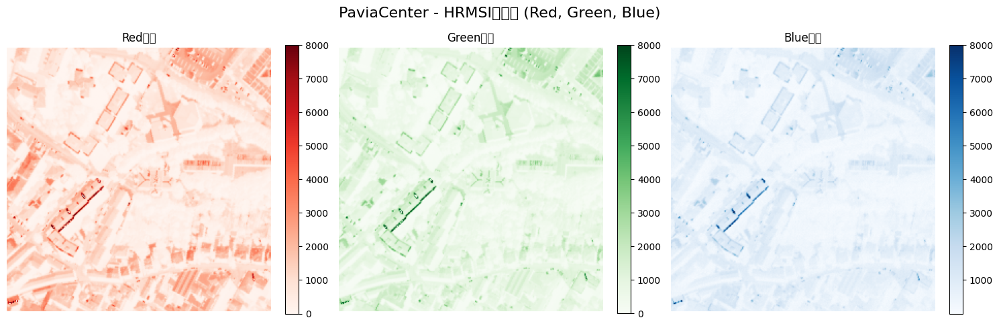

/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 20266 (\N{CJK UNIFIED IDEOGRAPH-4F2A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 24425 (\N{CJK UNIFIED IDEOGRAPH-5F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 33394 (\N{CJK UNIFIED IDEOGRAPH-8272}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 21333 (\N{CJK UNIFIED IDEOGRAPH-5355}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_120324/2953647257.py:337: UserWarning: Glyph 36873 (\N{CJK UN

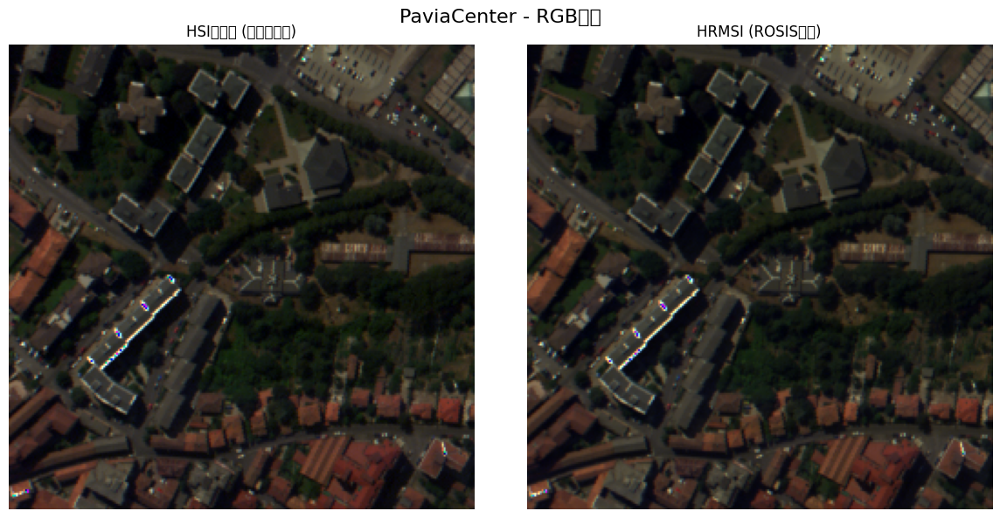

/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24378 (\N{CJK UNIFIED IDEOGRAPH-5F3A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20256 (\N{CJK UNIFIED IDEOGRAPH-4F20}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24863 (\N{CJK UNIFIED IDEOGRAPH-611F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtoo

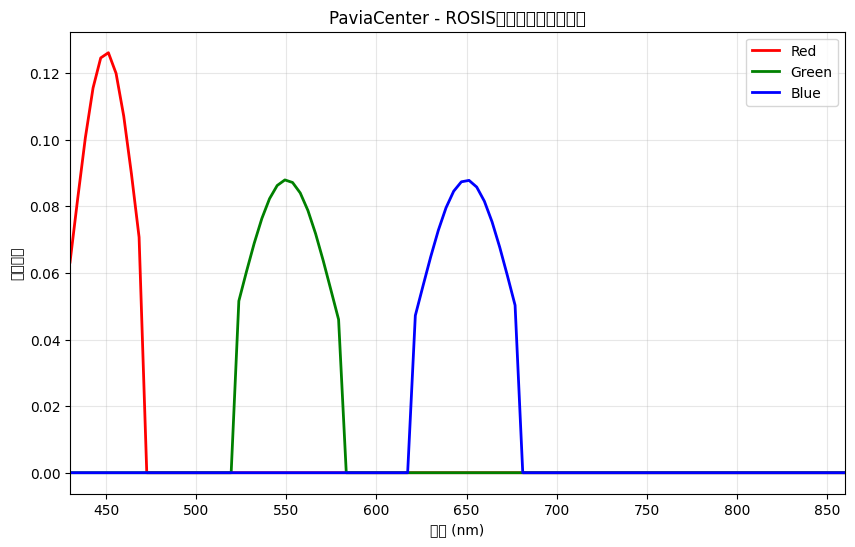

✅ PaviaCenter 处理完成!

🎯 处理 PaviaU 数据集
🚀 开始处理 PaviaU 数据集...
输入文件: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/PaviaU.mat
输出目录: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/PaviaU
🔍 分析 PaviaU MAT文件...
文件路径: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/PaviaU.mat
文件大小: 33.19 MB
数据键: ['paviaU']

📊 数据集 'paviaU':
  形状: (610, 340, 103)
  数据类型: uint16
  数值范围: [0.000000, 8000.000000]
  ✓ 检测到高光谱数据: 610×340×103 (HWC格式)
  空间尺寸: 610 × 340
  光谱通道: 103

✅ 成功识别 PaviaU 高光谱数据
=== 为Pavia数据集创建ROSIS响应函数 (103波段) ===
  生成 Blue 波段响应函数: 中心450nm, 带宽40nm
  生成 Green 波段响应函数: 中心550nm, 带宽60nm
  生成 Red 波段响应函数: 中心650nm, 带宽60nm
✅ ROSIS响应函数创建完成: (3, 103)

=== 生成HR-MSI ===
应用ROSIS响应函数:
  HSI数据形状: (610, 340, 103) (HWC)
  响应函数形状: (3, 103)
数据键: ['paviaU']

📊 数据集 'paviaU':
  形状: (610, 340, 103)
  数据类型: uint16
  数值范围: [0.000000, 8000.000000]
  ✓ 检测到高光谱数据: 610×340×103 (HWC格式)
  空间尺寸: 610 × 340
 

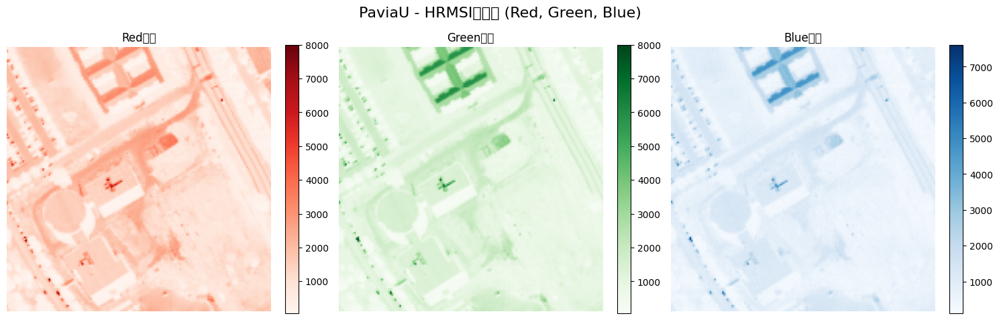

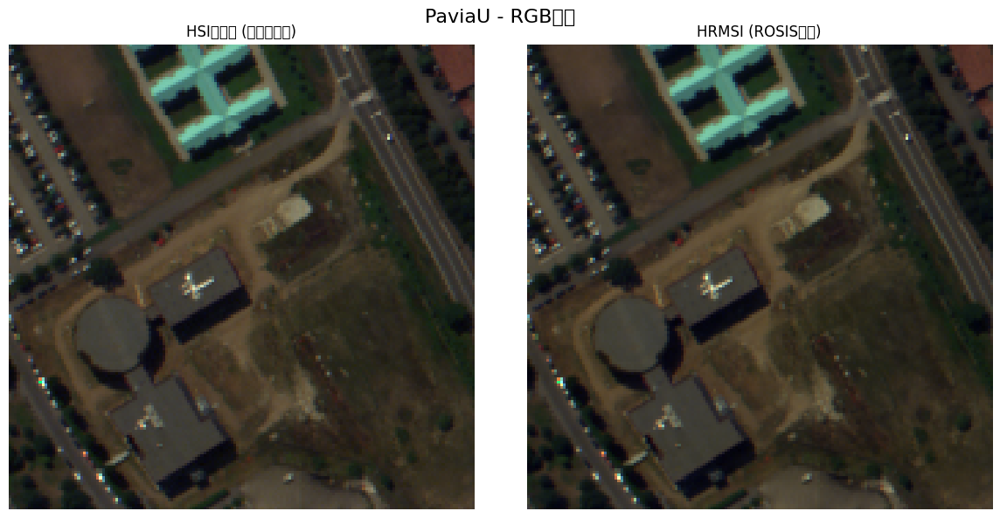

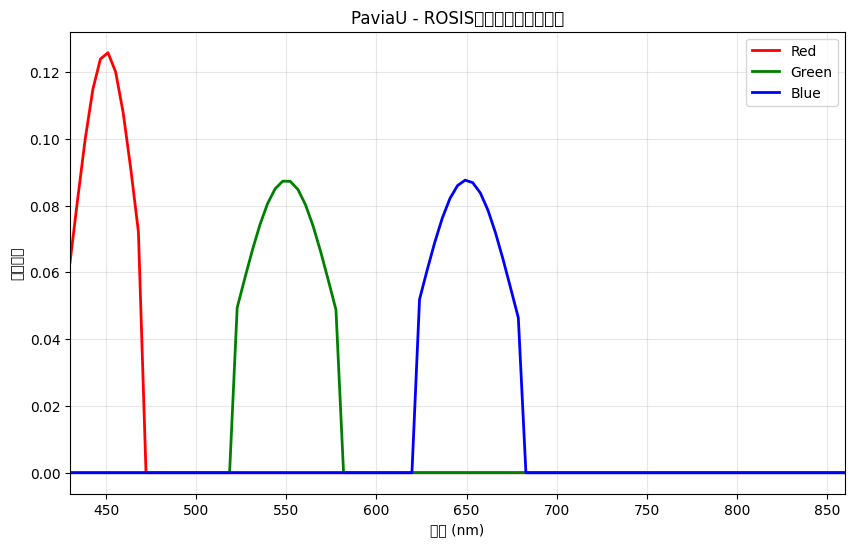

✅ PaviaU 处理完成!

📋 处理总结报告
PaviaCenter: ✅ 成功
  输出文件: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/PaviaCenter/PaviaCenter_ROSIS.h5
PaviaU: ✅ 成功
  输出文件: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/PaviaU/PaviaU_ROSIS.h5

🎉 总计: 2/2 个数据集处理成功

💡 生成的数据集格式:
  • gt: (C, H, W) - 原始高光谱真值
  • HRMSI: (3, H, W) - RGB波段 (Red, Green, Blue顺序)
  • 包含ROSIS光谱响应函数和元数据
  • 适合用于多图像融合深度学习训练


In [1]:
import scipy.io
import numpy as np
import h5py
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

def analyze_pavia_mat_file(mat_path, dataset_name):
    """分析Pavia MAT文件的结构"""
    
    print(f"🔍 分析 {dataset_name} MAT文件...")
    print(f"文件路径: {mat_path}")
    
    if not os.path.exists(mat_path):
        print(f"❌ 文件不存在: {mat_path}")
        return None, None
    
    file_size_mb = os.path.getsize(mat_path) / (1024**2)
    print(f"文件大小: {file_size_mb:.2f} MB")
    
    try:
        # 加载MAT文件
        mat_data = scipy.io.loadmat(mat_path)
        
        # 过滤掉MATLAB元数据
        data_keys = [key for key in mat_data.keys() if not key.startswith('__')]
        print(f"数据键: {data_keys}")
        
        # 查找高光谱数据
        hsi_data = None
        data_key = None
        
        for key in data_keys:
            data = mat_data[key]
            if isinstance(data, np.ndarray) and len(data.shape) == 3:
                print(f"\n📊 数据集 '{key}':")
                print(f"  形状: {data.shape}")
                print(f"  数据类型: {data.dtype}")
                print(f"  数值范围: [{data.min():.6f}, {data.max():.6f}]")
                
                # 判断数据格式
                h, w, c = data.shape
                if c > 50:  # 光谱通道数通常大于50
                    print(f"  ✓ 检测到高光谱数据: {h}×{w}×{c} (HWC格式)")
                    print(f"  空间尺寸: {h} × {w}")
                    print(f"  光谱通道: {c}")
                    hsi_data = data.astype(np.float32)
                    data_key = key
                    break
        
        if hsi_data is not None:
            print(f"\n✅ 成功识别 {dataset_name} 高光谱数据")
            return hsi_data, data_key
        else:
            print(f"❌ 未找到有效的高光谱数据")
            return None, None
            
    except Exception as e:
        print(f"❌ 读取文件失败: {e}")
        return None, None

def create_rosis_response_for_pavia(num_bands):
    """
    为Pavia数据集创建ROSIS传感器响应函数
    Pavia数据集通常有103个光谱波段 (430-860nm)
    """
    print(f"=== 为Pavia数据集创建ROSIS响应函数 ({num_bands}波段) ===")
    
    # Pavia数据集的波长范围：430-860nm
    pavia_wavelengths = np.linspace(430, 860, num_bands)
    
    # ROSIS传感器的RGB波段定义
    rosis_bands = {
        'Blue': {
            'center': 450,
            'bandwidth': 40,
            'range': (430, 470),
            'description': '蓝光波段'
        },
        'Green': {
            'center': 550,
            'bandwidth': 60,
            'range': (520, 580),
            'description': '绿光波段'
        },
        'Red': {
            'center': 650,
            'bandwidth': 60,
            'range': (620, 680),
            'description': '红光波段'
        }
    }
    
    # 生成每个波段的响应函数
    responses = []
    band_names = ['Blue', 'Green', 'Red']
    
    for band_name in band_names:
        band_info = rosis_bands[band_name]
        center = band_info['center']
        bandwidth = band_info['bandwidth']
        band_range = band_info['range']
        
        # 使用高斯函数建模响应
        response = np.zeros(num_bands)
        sigma = bandwidth / (2 * np.sqrt(2 * np.log(2)))
        
        for i, wl in enumerate(pavia_wavelengths):
            if band_range[0] <= wl <= band_range[1]:
                response[i] = np.exp(-0.5 * ((wl - center) / sigma) ** 2)
        
        # 归一化响应函数
        if np.sum(response) > 0:
            response = response / np.sum(response)
        
        responses.append(response)
        print(f"  生成 {band_name} 波段响应函数: 中心{center}nm, 带宽{bandwidth}nm")
    
    responses = np.array(responses)  # (3, num_bands)
    
    print(f"✅ ROSIS响应函数创建完成: {responses.shape}")
    return responses, pavia_wavelengths, band_names, rosis_bands

def apply_rosis_to_pavia_hsi(hsi_data, responses):
    """
    将ROSIS响应函数应用到Pavia高光谱数据
    
    Args:
        hsi_data: Pavia HSI数据 (H, W, C) - HWC格式
        responses: ROSIS响应函数 (3, C)
    
    Returns:
        hr_msi: HR-MSI数据 (H, W, 3) RGB顺序
    """
    
    h, w, c = hsi_data.shape
    num_bands = responses.shape[0]
    
    print(f"应用ROSIS响应函数:")
    print(f"  HSI数据形状: {hsi_data.shape} (HWC)")
    print(f"  响应函数形状: {responses.shape}")
    
    # 确保通道数匹配
    if c != responses.shape[1]:
        print(f"❌ 通道数不匹配: HSI有{c}个通道，响应函数需要{responses.shape[1]}个通道")
        return None
    
    # 应用光谱响应函数生成HR-MSI
    hr_msi = np.zeros((h, w, num_bands), dtype=np.float32)
    
    for i in range(num_bands):
        # 加权求和：每个多光谱波段 = Σ(HSI波段 × 对应响应权重)
        hr_msi[:, :, i] = np.sum(hsi_data * responses[i][None, None, :], axis=2)
        band_name = ['Blue', 'Green', 'Red'][i]
        print(f"  处理波段 {i+1}/{num_bands}: {band_name}")
    
    # 重新排列为Red, Green, Blue顺序
    hr_msi_rgb = hr_msi[:, :, [2, 1, 0]]  # BGR -> RGB
    
    return hr_msi_rgb

def process_pavia_dataset(mat_path, output_dir, dataset_name):
    """
    处理单个Pavia数据集
    """
    
    print(f"🚀 开始处理 {dataset_name} 数据集...")
    print(f"输入文件: {mat_path}")
    print(f"输出目录: {output_dir}")
    
    # 1. 分析和加载数据
    hsi_data, data_key = analyze_pavia_mat_file(mat_path, dataset_name)
    
    if hsi_data is None:
        print(f"❌ {dataset_name} 数据加载失败")
        return False
    
    # 2. 创建ROSIS响应函数
    h, w, c = hsi_data.shape
    responses, wavelengths, band_names, rosis_info = create_rosis_response_for_pavia(c)
    
    # 3. 应用响应函数生成HR-MSI
    print(f"\n=== 生成HR-MSI ===")
    hr_msi = apply_rosis_to_pavia_hsi(hsi_data, responses)
    
    if hr_msi is None:
        print(f"❌ HR-MSI生成失败")
        return False
    
    print(f"✅ HR-MSI生成完成!")
    print(f"HR-MSI形状: {hr_msi.shape}")
    print(f"HR-MSI数据范围: [{hr_msi.min():.6f}, {hr_msi.max():.6f}]")
    
    # 4. 创建输出目录
    os.makedirs(output_dir, exist_ok=True)
    
    # 5. 保存为H5文件
    output_path = os.path.join(output_dir, f"{dataset_name}_ROSIS.h5")
    
    print(f"\n=== 保存H5文件 ===")
    print(f"输出路径: {output_path}")
    
    with h5py.File(output_path, 'w') as f:
        # 保存gt（原始HSI）- 转换为CHW格式
        print("保存gt数据（原始HSI）...")
        gt_data = hsi_data.transpose(2, 0, 1).astype(np.float32)  # (C, H, W)
        f.create_dataset('gt', data=gt_data, compression='gzip', compression_opts=3)
        
        # 保存HRMSI - 转换为CHW格式
        print("保存HRMSI数据...")
        hrmsi_data = hr_msi.transpose(2, 0, 1).astype(np.float32)  # (3, H, W)
        f.create_dataset('HRMSI', data=hrmsi_data, compression='gzip', compression_opts=3)
        
        # 保存ROSIS响应函数
        print("保存ROSIS响应函数...")
        f.create_dataset('rosis_responses', data=responses)
        f.create_dataset('wavelengths', data=wavelengths)
        
        # 保存波段名称
        dt = h5py.special_dtype(vlen=str)
        f.create_dataset('band_names', data=['Red', 'Green', 'Blue'], dtype=dt)
        
        # 保存元数据
        f.attrs['dataset_name'] = dataset_name
        f.attrs['sensor_response'] = 'ROSIS'
        f.attrs['original_shape'] = (h, w, c)
        f.attrs['gt_shape'] = gt_data.shape
        f.attrs['hrmsi_shape'] = hrmsi_data.shape
        f.attrs['wavelength_range'] = '430-860nm'
        f.attrs['spectral_resolution'] = f'{(860-430)/c:.2f}nm'
        f.attrs['num_bands_hsi'] = c
        f.attrs['num_bands_msi'] = 3
        f.attrs['band_order'] = 'Red,Green,Blue'
        f.attrs['description'] = f'{dataset_name} with ROSIS sensor response: gt=HSI({c}bands), HRMSI=RGB(3bands)'
        f.attrs['source_data_key'] = data_key
        f.attrs['processing_date'] = '2025-08-11'
        
        # 保存每个波段的详细信息
        for i, (band_name, band_info) in enumerate(rosis_info.items()):
            band_group = f.create_group(f'band_info/{band_name}')
            band_group.attrs['center_wavelength'] = band_info['center']
            band_group.attrs['bandwidth'] = band_info['bandwidth']
            band_group.attrs['wavelength_range'] = f"{band_info['range'][0]}-{band_info['range'][1]}nm"
            band_group.attrs['description'] = band_info['description']
    
    # 6. 验证保存的文件
    file_size_mb = os.path.getsize(output_path) / (1024**2)
    print(f"✅ 文件保存成功!")
    print(f"文件大小: {file_size_mb:.2f} MB")
    
    return True

def visualize_pavia_results(h5_path, dataset_name):
    """可视化Pavia处理结果"""
    
    print(f"\n🎨 可视化 {dataset_name} 处理结果...")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            gt_data = f['gt'][:]        # (C, H, W)
            hrmsi_data = f['HRMSI'][:]  # (3, H, W)
            
            # 转换为HWC格式进行可视化
            gt_hwc = gt_data.transpose(1, 2, 0)      # (H, W, C)
            hrmsi_hwc = hrmsi_data.transpose(1, 2, 0)  # (H, W, 3)
            
            # 选择合适的区域进行显示
            h, w = gt_hwc.shape[:2]
            crop_size = min(256, h//2, w//2)
            center_h, center_w = h//2, w//2
            h_start = center_h - crop_size//2
            h_end = center_h + crop_size//2
            w_start = center_w - crop_size//2
            w_end = center_w + crop_size//2
            
            gt_crop = gt_hwc[h_start:h_end, w_start:w_end, :]
            hrmsi_crop = hrmsi_hwc[h_start:h_end, w_start:w_end, :]
            
            print(f"显示区域: {gt_crop.shape[:2]}")
            
            # 1. 显示RGB三个波段
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            fig.suptitle(f'{dataset_name} - HRMSI各波段 (Red, Green, Blue)', fontsize=16)
            
            band_names = ['Red', 'Green', 'Blue']
            cmaps = ['Reds', 'Greens', 'Blues']
            
            for i, (band_name, cmap) in enumerate(zip(band_names, cmaps)):
                im = axes[i].imshow(hrmsi_crop[:, :, i], cmap=cmap)
                axes[i].set_title(f'{band_name}波段')
                axes[i].axis('off')
                plt.colorbar(im, ax=axes[i], fraction=0.046)
                
                # 显示统计信息
                band_data = hrmsi_crop[:, :, i]
                print(f"{band_name}: 范围[{band_data.min():.6f}, {band_data.max():.6f}], 均值={band_data.mean():.6f}")
            
            plt.tight_layout()
            plt.show()
            
            # 2. RGB合成图像
            def normalize_for_display(data):
                data_norm = data - data.min()
                data_max = data_norm.max()
                if data_max > 0:
                    data_norm = data_norm / data_max
                return np.power(data_norm, 0.8)  # 伽马校正
            
            rgb_display = normalize_for_display(hrmsi_crop)
            
            # 对比原始HSI的RGB近似
            wavelengths = np.linspace(430, 860, gt_crop.shape[2])
            
            # 找到最接近RGB波长的波段
            red_band_idx = np.argmin(np.abs(wavelengths - 650))
            green_band_idx = np.argmin(np.abs(wavelengths - 550))
            blue_band_idx = np.argmin(np.abs(wavelengths - 450))
            
            hsi_rgb = np.stack([
                gt_crop[:, :, red_band_idx],
                gt_crop[:, :, green_band_idx],
                gt_crop[:, :, blue_band_idx]
            ], axis=2)
            hsi_rgb_display = normalize_for_display(hsi_rgb)
            
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            
            axes[0].imshow(hsi_rgb_display)
            axes[0].set_title('HSI伪彩色 (单波段选择)')
            axes[0].axis('off')
            
            axes[1].imshow(rgb_display)
            axes[1].set_title('HRMSI (ROSIS响应)')
            axes[1].axis('off')
            
            plt.suptitle(f'{dataset_name} - RGB对比', fontsize=16)
            plt.tight_layout()
            plt.show()
            
            # 3. 光谱响应函数
            if 'rosis_responses' in f and 'wavelengths' in f:
                responses = f['rosis_responses'][:]
                wavelengths_resp = f['wavelengths'][:]
                
                plt.figure(figsize=(10, 6))
                colors = ['red', 'green', 'blue']
                for i, (band_name, color) in enumerate(zip(band_names, colors)):
                    plt.plot(wavelengths_resp, responses[i], 
                            label=band_name, color=color, linewidth=2)
                
                plt.xlabel('波长 (nm)')
                plt.ylabel('响应强度')
                plt.title(f'{dataset_name} - ROSIS传感器光谱响应函数')
                plt.legend()
                plt.grid(True, alpha=0.3)
                plt.xlim(430, 860)
                plt.show()
            
            return True
            
    except Exception as e:
        print(f"❌ 可视化失败: {e}")
        return False

def process_all_pavia_datasets():
    """处理所有Pavia数据集"""
    
    print("🚀 开始处理所有Pavia数据集...")
    
    # 定义数据集信息
    datasets = [
        {
            'name': 'PaviaCenter',
            'mat_path': '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Pavia.mat',
            'output_dir': '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/PaviaCenter'
        },
        {
            'name': 'PaviaU', 
            'mat_path': '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/PaviaU.mat',
            'output_dir': '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/PaviaU'
        }
    ]
    
    results = []
    
    for dataset_info in datasets:
        print(f"\n" + "="*60)
        print(f"🎯 处理 {dataset_info['name']} 数据集")
        print(f"="*60)
        
        success = process_pavia_dataset(
            dataset_info['mat_path'],
            dataset_info['output_dir'], 
            dataset_info['name']
        )
        
        if success:
            # 可视化结果
            h5_path = os.path.join(dataset_info['output_dir'], f"{dataset_info['name']}_ROSIS.h5")
            visualize_pavia_results(h5_path, dataset_info['name'])
            
            results.append({
                'name': dataset_info['name'],
                'success': True,
                'output_path': h5_path
            })
            
            print(f"✅ {dataset_info['name']} 处理完成!")
        else:
            results.append({
                'name': dataset_info['name'],
                'success': False,
                'output_path': None
            })
            print(f"❌ {dataset_info['name']} 处理失败!")
    
    # 总结报告
    print(f"\n" + "="*60)
    print("📋 处理总结报告")
    print(f"="*60)
    
    for result in results:
        status = "✅ 成功" if result['success'] else "❌ 失败"
        print(f"{result['name']}: {status}")
        if result['success']:
            print(f"  输出文件: {result['output_path']}")
    
    successful_count = sum(1 for r in results if r['success'])
    print(f"\n🎉 总计: {successful_count}/{len(results)} 个数据集处理成功")
    
    if successful_count > 0:
        print(f"\n💡 生成的数据集格式:")
        print(f"  • gt: (C, H, W) - 原始高光谱真值")
        print(f"  • HRMSI: (3, H, W) - RGB波段 (Red, Green, Blue顺序)")
        print(f"  • 包含ROSIS光谱响应函数和元数据")
        print(f"  • 适合用于多图像融合深度学习训练")
    
    return results

# 执行处理
print("🚀 开始Pavia数据集的ROSIS处理...")
results = process_all_pavia_datasets()

🚀 开始分析Botswana.mat文件...
🔍 分析 Botswana.mat 文件...
文件路径: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Botswana.mat
文件大小: 75.26 MB

📂 MAT文件中的所有键:
  __header__
  __version__
  __globals__
  Botswana

📊 数据键 (非元数据): ['Botswana']

--- 分析数据键 'Botswana' ---
数据类型: <class 'numpy.ndarray'>
数组形状: (1476, 256, 145)
数据类型: uint16
数组维度: 3D
数值范围: [0.000000, 45106.000000]
数据均值: 1749.621654
数据标准差: 1474.683812
🎯 3D数据分析:
  空间尺寸: 1476 × 256
  第三维长度: 145
  ✓ 很可能是高光谱图像 (HWC格式)
  ✓ 145 个光谱通道
  典型波段分析:
    波段 0: 范围[3308.000000, 45106.000000], 均值=4626.981025
    波段 36: 范围[358.000000, 7354.000000], 均值=3475.551543
    波段 72: 范围[0.000000, 2953.000000], 均值=1573.399935
    波段 108: 范围[0.000000, 2085.000000], 均值=409.190710
    波段 144: 范围[0.000000, 2439.000000], 均值=94.498529

🌈 高光谱数据识别:
找到 1 个可能的高光谱数据集:
  ✓ Botswana: 形状=(1476, 256, 145), 光谱通道=145
    → 可能是Botswana数据集 (Hyperion传感器)
    → 光谱范围: 约400-2500nm
    → 空间分辨率: 30m

🏷️ 标签数据识别:
❌ 未找到明显的标签数据

🎨 准备可视化...
使用数据集 'Bot

/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 31532 (\N{CJK UNIFIED IDEOGRAPH-7B2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 20010 (\N{CJK UNIFIED IDEOGRAPH-4E2A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 39640 (\N{CJK UNIFIED IDEOGRAPH-9AD8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 20809 (\N{CJK UNIFIED IDEOGRAPH-5149}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/3455062356.py:205: UserWarning: Glyph 35889 (\N{CJK UN

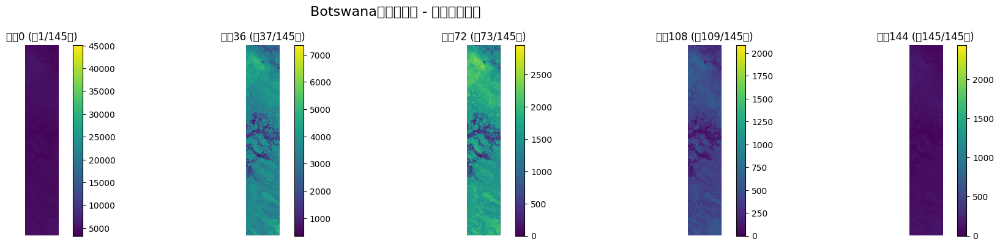

/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20266 (\N{CJK UNIFIED IDEOGRAPH-4F2A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24425 (\N{CJK UNIFIED IDEOGRAPH-5F69}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 33394 (\N{CJK UNIFIED IDEOGRAPH-8272}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 21512 (\N{CJK UNIFIED IDEOGRAPH-5408}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtoo

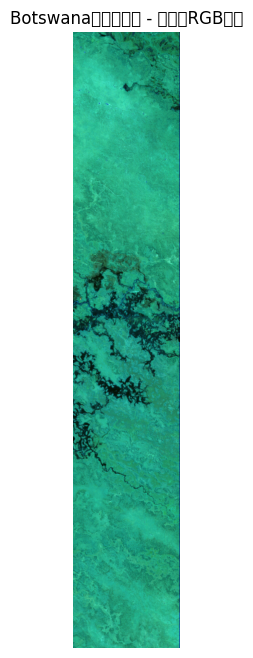


📋 Botswana数据集总结:
✅ 这是一个高光谱遥感数据集
✅ 数据来源: Botswana地区 (博茨瓦纳)
✅ 传感器: 可能是Hyperion高光谱传感器
✅ 用途: 适用于高光谱图像分类、目标检测等研究
✅ 可以用于多图像融合研究的真值数据


In [1]:
import scipy.io
import numpy as np
import os

def analyze_botswana_mat():
    """分析Botswana.mat文件的详细内容"""
    
    mat_path = '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Botswana.mat'
    
    print("🔍 分析 Botswana.mat 文件...")
    print(f"文件路径: {mat_path}")
    
    # 检查文件是否存在
    if not os.path.exists(mat_path):
        print(f"❌ 文件不存在: {mat_path}")
        return
    
    # 文件基本信息
    file_size_mb = os.path.getsize(mat_path) / (1024**2)
    print(f"文件大小: {file_size_mb:.2f} MB")
    
    try:
        # 加载MAT文件
        mat_data = scipy.io.loadmat(mat_path)
        
        print(f"\n📂 MAT文件中的所有键:")
        all_keys = list(mat_data.keys())
        for key in all_keys:
            print(f"  {key}")
        
        # 过滤掉MATLAB元数据键
        data_keys = [key for key in mat_data.keys() if not key.startswith('__')]
        print(f"\n📊 数据键 (非元数据): {data_keys}")
        
        # 详细分析每个数据键
        for key in data_keys:
            data = mat_data[key]
            print(f"\n--- 分析数据键 '{key}' ---")
            print(f"数据类型: {type(data)}")
            
            if isinstance(data, np.ndarray):
                print(f"数组形状: {data.shape}")
                print(f"数据类型: {data.dtype}")
                print(f"数组维度: {data.ndim}D")
                
                # 计算数据统计
                print(f"数值范围: [{data.min():.6f}, {data.max():.6f}]")
                print(f"数据均值: {data.mean():.6f}")
                print(f"数据标准差: {data.std():.6f}")
                
                # 判断数据可能的含义
                if len(data.shape) == 3:
                    h, w, c = data.shape
                    print(f"🎯 3D数据分析:")
                    print(f"  空间尺寸: {h} × {w}")
                    print(f"  第三维长度: {c}")
                    
                    if c > 50:
                        print(f"  ✓ 很可能是高光谱图像 (HWC格式)")
                        print(f"  ✓ {c} 个光谱通道")
                        
                        # 分析几个典型波段
                        print(f"  典型波段分析:")
                        band_indices = [0, c//4, c//2, c*3//4, c-1]
                        for i, band_idx in enumerate(band_indices):
                            band_data = data[:, :, band_idx]
                            print(f"    波段 {band_idx}: 范围[{band_data.min():.6f}, {band_data.max():.6f}], 均值={band_data.mean():.6f}")
                    
                    elif c <= 10:
                        print(f"  可能是RGB/多光谱图像或其他3D数据")
                        
                elif len(data.shape) == 2:
                    h, w = data.shape
                    print(f"🎯 2D数据分析:")
                    print(f"  尺寸: {h} × {w}")
                    print(f"  可能是单通道图像、标签图或其他2D数据")
                    
                    # 检查是否是标签数据
                    unique_values = np.unique(data)
                    if len(unique_values) < 50:
                        print(f"  唯一值数量: {len(unique_values)}")
                        print(f"  唯一值: {unique_values[:10]}{'...' if len(unique_values) > 10 else ''}")
                        print(f"  ✓ 可能是标签/分类图")
                
                elif len(data.shape) == 1:
                    print(f"🎯 1D数据分析:")
                    print(f"  长度: {data.shape[0]}")
                    print(f"  可能是波长信息、标签或其他向量数据")
                    
                    # 显示部分数据
                    print(f"  前10个值: {data[:10]}")
                    if len(data) > 10:
                        print(f"  后10个值: {data[-10:]}")
                
            elif isinstance(data, (list, tuple)):
                print(f"列表/元组长度: {len(data)}")
                print(f"内容: {data}")
                
            else:
                print(f"其他数据类型，内容: {data}")
        
        # 特别查找可能的高光谱数据
        print(f"\n🌈 高光谱数据识别:")
        hsi_candidates = []
        
        for key in data_keys:
            data = mat_data[key]
            if isinstance(data, np.ndarray) and len(data.shape) == 3:
                h, w, c = data.shape
                if c > 50:  # 光谱通道数大于50
                    hsi_candidates.append((key, data.shape, c))
        
        if hsi_candidates:
            print(f"找到 {len(hsi_candidates)} 个可能的高光谱数据集:")
            for key, shape, channels in hsi_candidates:
                print(f"  ✓ {key}: 形状={shape}, 光谱通道={channels}")
                
                # 如果是标准的高光谱通道数，给出更多信息
                if channels in [144, 176, 200, 224, 242]:
                    print(f"    → 符合常见高光谱传感器通道数")
                
                # Botswana数据集的特殊信息
                if 'botswana' in key.lower() or channels == 145:
                    print(f"    → 可能是Botswana数据集 (Hyperion传感器)")
                    print(f"    → 光谱范围: 约400-2500nm")
                    print(f"    → 空间分辨率: 30m")
        else:
            print(f"❌ 未找到明显的高光谱数据")
        
        # 查找可能的标签数据
        print(f"\n🏷️ 标签数据识别:")
        label_candidates = []
        
        for key in data_keys:
            data = mat_data[key]
            if isinstance(data, np.ndarray) and len(data.shape) == 2:
                unique_vals = np.unique(data)
                if len(unique_vals) < 50 and data.dtype in [np.int8, np.int16, np.int32, np.uint8, np.uint16]:
                    label_candidates.append((key, data.shape, len(unique_vals), unique_vals))
        
        if label_candidates:
            print(f"找到 {len(label_candidates)} 个可能的标签数据集:")
            for key, shape, num_classes, unique_vals in label_candidates:
                print(f"  ✓ {key}: 形状={shape}, 类别数={num_classes}")
                print(f"    类别值: {unique_vals[:15]}{'...' if len(unique_vals) > 15 else ''}")
        else:
            print(f"❌ 未找到明显的标签数据")
            
        return mat_data
        
    except Exception as e:
        print(f"❌ 读取文件失败: {e}")
        return None

def visualize_botswana_data(mat_data):
    """可视化Botswana数据"""
    
    if mat_data is None:
        return
    
    print(f"\n🎨 准备可视化...")
    
    try:
        import matplotlib.pyplot as plt
        
        # 查找高光谱数据
        data_keys = [key for key in mat_data.keys() if not key.startswith('__')]
        hsi_data = None
        hsi_key = None
        
        for key in data_keys:
            data = mat_data[key]
            if isinstance(data, np.ndarray) and len(data.shape) == 3:
                h, w, c = data.shape
                if c > 50:
                    hsi_data = data
                    hsi_key = key
                    break
        
        if hsi_data is not None:
            print(f"使用数据集 '{hsi_key}' 进行可视化")
            print(f"数据形状: {hsi_data.shape}")
            
            # 选择几个代表性波段进行显示
            h, w, c = hsi_data.shape
            
            # 选择不同波段
            band_indices = [0, c//4, c//2, c*3//4, c-1]
            band_names = [f'波段{i} (第{i+1}/{c}个)' for i in band_indices]
            
            fig, axes = plt.subplots(1, 5, figsize=(20, 4))
            fig.suptitle(f'Botswana高光谱数据 - 典型波段显示', fontsize=16)
            
            for i, (band_idx, band_name) in enumerate(zip(band_indices, band_names)):
                band_data = hsi_data[:, :, band_idx]
                
                im = axes[i].imshow(band_data, cmap='viridis')
                axes[i].set_title(band_name)
                axes[i].axis('off')
                plt.colorbar(im, ax=axes[i], fraction=0.046)
                
                # 显示统计信息
                print(f"{band_name}: 范围[{band_data.min():.6f}, {band_data.max():.6f}], 均值={band_data.mean():.6f}")
            
            plt.tight_layout()
            plt.show()
            
            # 创建伪彩色RGB图像
            # 选择三个波段作为RGB
            if c >= 100:
                # 对于高光谱数据，选择红、绿、蓝光谱区域的波段
                red_band = hsi_data[:, :, int(c * 0.8)]    # 后段波长 (红光区域)
                green_band = hsi_data[:, :, int(c * 0.5)]  # 中段波长 (绿光区域)
                blue_band = hsi_data[:, :, int(c * 0.2)]   # 前段波长 (蓝光区域)
            else:
                red_band = hsi_data[:, :, min(c-1, 60)]
                green_band = hsi_data[:, :, min(c//2, 30)]
                blue_band = hsi_data[:, :, min(10, c//4)]
            
            # 归一化RGB通道
            def normalize_channel(channel):
                min_val, max_val = channel.min(), channel.max()
                if max_val > min_val:
                    return (channel - min_val) / (max_val - min_val)
                return channel
            
            rgb_image = np.stack([
                normalize_channel(red_band),
                normalize_channel(green_band),
                normalize_channel(blue_band)
            ], axis=2)
            
            # 应用伽马校正
            gamma = 0.8
            rgb_image = np.power(rgb_image, gamma)
            
            plt.figure(figsize=(8, 8))
            plt.imshow(rgb_image)
            plt.title('Botswana高光谱数据 - 伪彩色RGB合成')
            plt.axis('off')
            plt.show()
            
        else:
            print("❌ 未找到适合可视化的高光谱数据")
            
    except ImportError:
        print("⚠️ matplotlib未安装，跳过可视化")
    except Exception as e:
        print(f"❌ 可视化失败: {e}")

# 执行分析
print("🚀 开始分析Botswana.mat文件...")
mat_data = analyze_botswana_mat()

# 如果成功加载数据，进行可视化
if mat_data is not None:
    visualize_botswana_data(mat_data)
    
    print(f"\n📋 Botswana数据集总结:")
    print(f"✅ 这是一个高光谱遥感数据集")
    print(f"✅ 数据来源: Botswana地区 (博茨瓦纳)")
    print(f"✅ 传感器: 可能是Hyperion高光谱传感器")
    print(f"✅ 用途: 适用于高光谱图像分类、目标检测等研究")
    print(f"✅ 可以用于多图像融合研究的真值数据")
else:
    print(f"\n❌ 无法加载Botswana.mat文件")

🚀 开始Botswana数据集的RGB处理...
🚀 开始使用RGB响应函数处理Botswana数据集...
🔍 分析 Botswana MAT文件...
文件路径: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Botswana.mat
文件大小: 75.26 MB
数据键: ['Botswana']

📊 数据集 'Botswana':
  形状: (1476, 256, 145)
  数据类型: uint16
  数值范围: [0.000000, 45106.000000]
  ✓ 检测到高光谱数据: 1476×256×145 (HWC格式)
  空间尺寸: 1476 × 256
  光谱通道: 145
  ✓ 符合Botswana/Hyperion数据集特征

✅ 成功识别 Botswana 高光谱数据
=== 为Botswana数据集创建RGB响应函数 (145波段) ===
  生成 Red 波段响应函数: 中心655nm, 带宽60nm
  生成 Green 波段响应函数: 中心562nm, 带宽60nm
  生成 Blue 波段响应函数: 中心482nm, 带宽60nm
✅ RGB响应函数创建完成: (3, 145)
✅ 波段顺序: ['Red', 'Green', 'Blue']

=== 生成HR-MSI ===
应用RGB响应函数:
  HSI数据形状: (1476, 256, 145) (HWC)
  响应函数形状: (3, 145)
  输出波段顺序: Red, Green, Blue
数据键: ['Botswana']

📊 数据集 'Botswana':
  形状: (1476, 256, 145)
  数据类型: uint16
  数值范围: [0.000000, 45106.000000]
  ✓ 检测到高光谱数据: 1476×256×145 (HWC格式)
  空间尺寸: 1476 × 256
  光谱通道: 145
  ✓ 符合Botswana/Hyperion数据集特征

✅ 成功识别 Botswana 高光谱数据
=== 为Botswana数据集创建RGB响应函数 (14

/tmp/ipykernel_263312/2133249449.py:314: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:314: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:314: UserWarning: Glyph 21508 (\N{CJK UNIFIED IDEOGRAPH-5404}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:314: UserWarning: Glyph 39034 (\N{CJK UNIFIED IDEOGRAPH-987A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:314: UserWarning: Glyph 24207 (\N{CJK UNIFIED IDEOGRAPH-5E8F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 21508 (\N{CJK UNIFIED IDEOGRAPH-5404}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/

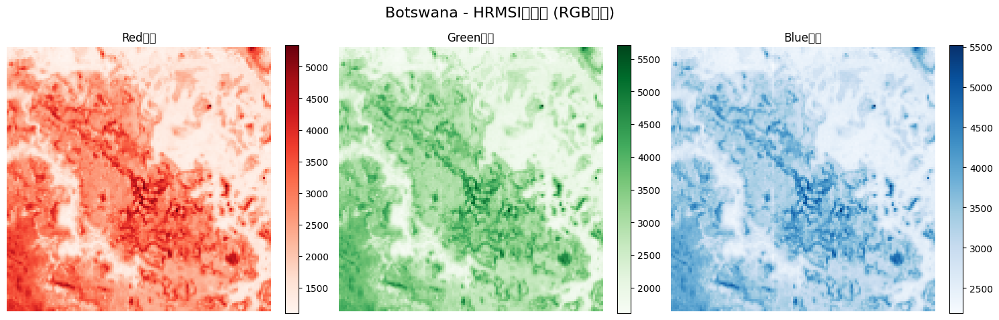

/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 20266 (\N{CJK UNIFIED IDEOGRAPH-4F2A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 24425 (\N{CJK UNIFIED IDEOGRAPH-5F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 33394 (\N{CJK UNIFIED IDEOGRAPH-8272}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 21333 (\N{CJK UNIFIED IDEOGRAPH-5355}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 27874 (\N{CJK UNIFIED IDEOGRAPH-6CE2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 27573 (\N{CJK UNIFIED IDEOGRAPH-6BB5}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_263312/2133249449.py:354: UserWarning: Glyph 36873 (\N{CJK UN

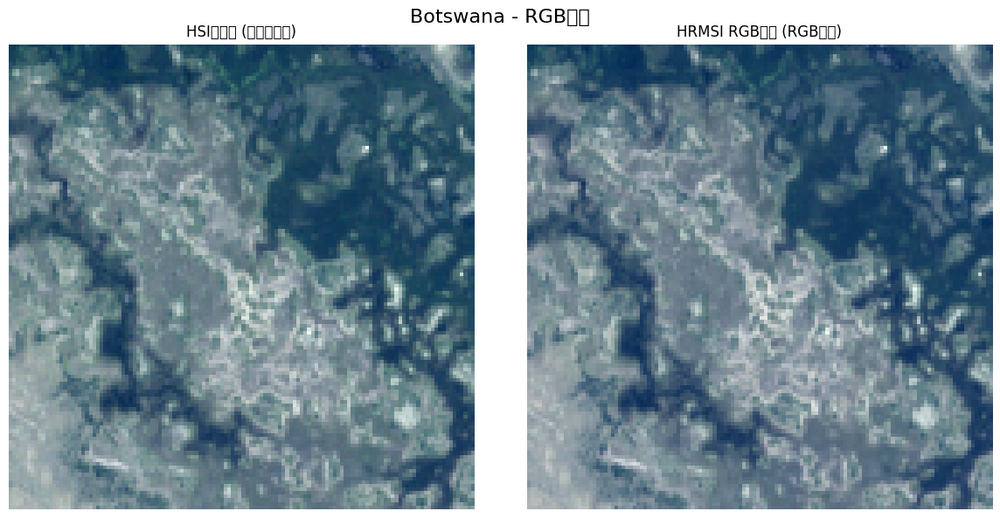

/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24378 (\N{CJK UNIFIED IDEOGRAPH-5F3A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20256 (\N{CJK UNIFIED IDEOGRAPH-4F20}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24863 (\N{CJK UNIFIED IDEOGRAPH-611F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/data2/users/yujieliang/env/yujie/lib/python3.12/site-packages/IPython/core/pylabtoo

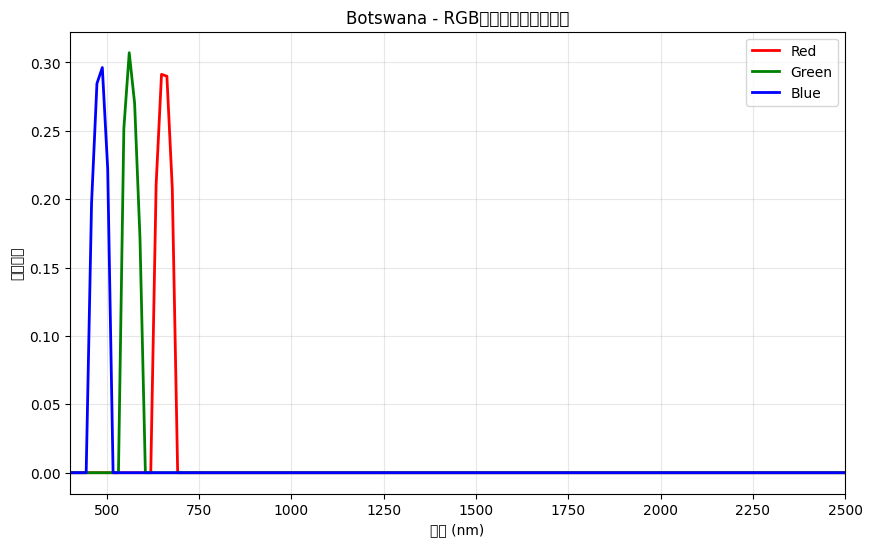


🔍 RGB顺序验证:
  第0个通道: Red (应该是Red)
  第1个通道: Green (应该是Green)
  第2个通道: Blue (应该是Blue)
  ✅ RGB顺序正确!

🎉 所有处理和可视化完成！

📋 生成的数据集信息:
✅ 数据集: Botswana (博茨瓦纳)
✅ 传感器响应: RGB
✅ 输出文件: /data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/Botswana/Botswana_RGB.h5
✅ GT形状: (145, 1476, 256) (原始高光谱)
✅ HRMSI形状: (3, 1476, 256) (3波段RGB)
✅ 波段顺序: ['Red', 'Green', 'Blue']

💡 数据集特点:
  • 原始数据: Hyperion高光谱传感器 (400-2500nm)
  • 仿真数据: RGB三通道 (Red, Green, Blue)
  • 波段顺序: 严格按照 R-G-B 排列
  • 适用于: 多图像融合、超分辨率重建

🏁 Botswana RGB处理流程结束


In [2]:
import scipy.io
import numpy as np
import h5py
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

def analyze_botswana_mat_file():
    """分析Botswana MAT文件的结构"""
    
    mat_path = '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/HyperSpectral-Collections/allmats/Botswana.mat'
    dataset_name = 'Botswana'
    
    print(f"🔍 分析 {dataset_name} MAT文件...")
    print(f"文件路径: {mat_path}")
    
    if not os.path.exists(mat_path):
        print(f"❌ 文件不存在: {mat_path}")
        return None, None
    
    file_size_mb = os.path.getsize(mat_path) / (1024**2)
    print(f"文件大小: {file_size_mb:.2f} MB")
    
    try:
        # 加载MAT文件
        mat_data = scipy.io.loadmat(mat_path)
        
        # 过滤掉MATLAB元数据
        data_keys = [key for key in mat_data.keys() if not key.startswith('__')]
        print(f"数据键: {data_keys}")
        
        # 查找高光谱数据
        hsi_data = None
        data_key = None
        
        for key in data_keys:
            data = mat_data[key]
            if isinstance(data, np.ndarray) and len(data.shape) == 3:
                print(f"\n📊 数据集 '{key}':")
                print(f"  形状: {data.shape}")
                print(f"  数据类型: {data.dtype}")
                print(f"  数值范围: [{data.min():.6f}, {data.max():.6f}]")
                
                # 判断数据格式
                h, w, c = data.shape
                if c > 50:  # 光谱通道数通常大于50
                    print(f"  ✓ 检测到高光谱数据: {h}×{w}×{c} (HWC格式)")
                    print(f"  空间尺寸: {h} × {w}")
                    print(f"  光谱通道: {c}")
                    
                    # Botswana数据集特征检查
                    if c in [145, 144, 176]:  # Hyperion传感器通道数
                        print(f"  ✓ 符合Botswana/Hyperion数据集特征")
                        hsi_data = data.astype(np.float32)
                        data_key = key
                        break
        
        if hsi_data is not None:
            print(f"\n✅ 成功识别 {dataset_name} 高光谱数据")
            return hsi_data, data_key
        else:
            print(f"❌ 未找到有效的高光谱数据")
            return None, None
            
    except Exception as e:
        print(f"❌ 读取文件失败: {e}")
        return None, None

def create_rgb_response_for_botswana(num_bands):
    """
    为Botswana数据集创建RGB传感器响应函数
    只生成Red, Green, Blue三个波段
    """
    print(f"=== 为Botswana数据集创建RGB响应函数 ({num_bands}波段) ===")
    
    # Botswana/Hyperion数据集的波长范围：400-2500nm
    botswana_wavelengths = np.linspace(400, 2500, num_bands)
    
    # RGB波段定义（按RGB顺序）
    rgb_bands = {
        'Red': {
            'center': 655,
            'bandwidth': 60,
            'range': (625, 685),
            'description': '红光波段'
        },
        'Green': {
            'center': 562,
            'bandwidth': 60,
            'range': (532, 592),
            'description': '绿光波段'
        },
        'Blue': {
            'center': 482,
            'bandwidth': 60,
            'range': (452, 512),
            'description': '蓝光波段'
        }
    }
    
    # 生成每个波段的响应函数（按RGB顺序）
    responses = []
    band_names = ['Red', 'Green', 'Blue']  # 确保RGB顺序
    
    for band_name in band_names:
        band_info = rgb_bands[band_name]
        center = band_info['center']
        bandwidth = band_info['bandwidth']
        band_range = band_info['range']
        
        # 使用高斯函数建模响应
        response = np.zeros(num_bands)
        sigma = bandwidth / (2 * np.sqrt(2 * np.log(2)))  # FWHM转标准差
        
        for i, wl in enumerate(botswana_wavelengths):
            if band_range[0] <= wl <= band_range[1]:
                response[i] = np.exp(-0.5 * ((wl - center) / sigma) ** 2)
        
        # 归一化响应函数
        if np.sum(response) > 0:
            response = response / np.sum(response)
        
        responses.append(response)
        print(f"  生成 {band_name} 波段响应函数: 中心{center}nm, 带宽{bandwidth}nm")
    
    responses = np.array(responses)  # (3, num_bands) - RGB顺序
    
    print(f"✅ RGB响应函数创建完成: {responses.shape}")
    print(f"✅ 波段顺序: {band_names}")
    return responses, botswana_wavelengths, band_names, rgb_bands

def apply_rgb_to_botswana_hsi(hsi_data, responses):
    """
    将RGB响应函数应用到Botswana高光谱数据
    
    Args:
        hsi_data: Botswana HSI数据 (H, W, C) - HWC格式
        responses: RGB响应函数 (3, C) - RGB顺序
    
    Returns:
        hr_msi: HR-MSI数据 (H, W, 3) RGB顺序
    """
    
    h, w, c = hsi_data.shape
    num_bands = responses.shape[0]
    
    print(f"应用RGB响应函数:")
    print(f"  HSI数据形状: {hsi_data.shape} (HWC)")
    print(f"  响应函数形状: {responses.shape}")
    print(f"  输出波段顺序: Red, Green, Blue")
    
    # 确保通道数匹配
    if c != responses.shape[1]:
        print(f"❌ 通道数不匹配: HSI有{c}个通道，响应函数需要{responses.shape[1]}个通道")
        return None
    
    # 应用光谱响应函数生成HR-MSI
    hr_msi = np.zeros((h, w, num_bands), dtype=np.float32)
    
    band_names = ['Red', 'Green', 'Blue']
    
    for i in range(num_bands):
        # 加权求和：每个多光谱波段 = Σ(HSI波段 × 对应响应权重)
        hr_msi[:, :, i] = np.sum(hsi_data * responses[i][None, None, :], axis=2)
        print(f"  处理波段 {i+1}/{num_bands}: {band_names[i]}")
    
    return hr_msi

def process_botswana_with_rgb():
    """
    使用RGB响应函数处理Botswana数据集
    """
    
    print("🚀 开始使用RGB响应函数处理Botswana数据集...")
    
    # 定义输出目录
    output_dir = '/data2/users/yujieliang/exps/Efficient-MIF-back-master-6-feat/data/Botswana'
    dataset_name = 'Botswana'
    
    # 1. 分析和加载数据
    hsi_data, data_key = analyze_botswana_mat_file()
    
    if hsi_data is None:
        print(f"❌ {dataset_name} 数据加载失败")
        return False
    
    # 2. 创建RGB响应函数
    h, w, c = hsi_data.shape
    responses, wavelengths, band_names, rgb_info = create_rgb_response_for_botswana(c)
    
    # 3. 应用响应函数生成HR-MSI
    print(f"\n=== 生成HR-MSI ===")
    hr_msi = apply_rgb_to_botswana_hsi(hsi_data, responses)
    
    if hr_msi is None:
        print(f"❌ HR-MSI生成失败")
        return False
    
    print(f"✅ HR-MSI生成完成!")
    print(f"HR-MSI形状: {hr_msi.shape}")
    print(f"HR-MSI数据范围: [{hr_msi.min():.6f}, {hr_msi.max():.6f}]")
    print(f"波段顺序: {band_names}")
    
    # 4. 创建输出目录
    os.makedirs(output_dir, exist_ok=True)
    
    # 5. 保存为H5文件
    output_path = os.path.join(output_dir, f"{dataset_name}_RGB.h5")
    
    print(f"\n=== 保存H5文件 ===")
    print(f"输出路径: {output_path}")
    
    with h5py.File(output_path, 'w') as f:
        # 保存gt（原始HSI）- 转换为CHW格式
        print("保存gt数据（原始HSI）...")
        gt_data = hsi_data.transpose(2, 0, 1).astype(np.float32)  # (C, H, W)
        f.create_dataset('gt', data=gt_data, compression='gzip', compression_opts=3)
        
        # 保存HRMSI - 转换为CHW格式
        print("保存HRMSI数据（RGB顺序）...")
        hrmsi_data = hr_msi.transpose(2, 0, 1).astype(np.float32)  # (3, H, W) - RGB顺序
        f.create_dataset('HRMSI', data=hrmsi_data, compression='gzip', compression_opts=3)
        
        # 保存RGB响应函数
        print("保存RGB响应函数...")
        f.create_dataset('rgb_responses', data=responses)
        f.create_dataset('wavelengths', data=wavelengths)
        
        # 保存波段名称（RGB顺序）
        dt = h5py.special_dtype(vlen=str)
        f.create_dataset('band_names', data=band_names, dtype=dt)
        
        # 保存元数据
        f.attrs['dataset_name'] = dataset_name
        f.attrs['sensor_response'] = 'RGB'
        f.attrs['original_shape'] = (h, w, c)
        f.attrs['gt_shape'] = gt_data.shape
        f.attrs['hrmsi_shape'] = hrmsi_data.shape
        f.attrs['wavelength_range'] = '400-2500nm'
        f.attrs['spectral_resolution'] = f'{(2500-400)/c:.2f}nm'
        f.attrs['num_bands_hsi'] = c
        f.attrs['num_bands_msi'] = len(band_names)
        f.attrs['band_order'] = 'Red,Green,Blue'
        f.attrs['description'] = f'{dataset_name} with RGB sensor response: gt=HSI({c}bands), HRMSI=RGB(3bands in R-G-B order)'
        f.attrs['source_data_key'] = data_key
        f.attrs['processing_date'] = '2025-08-11'
        f.attrs['location'] = 'Botswana, Africa'
        f.attrs['original_sensor'] = 'Hyperion'
        f.attrs['simulated_sensor'] = 'RGB'
        
        # 保存每个波段的详细信息
        for i, (band_name, band_info) in enumerate(rgb_info.items()):
            band_group = f.create_group(f'band_info/{band_name}')
            band_group.attrs['center_wavelength'] = band_info['center']
            band_group.attrs['bandwidth'] = band_info['bandwidth']
            band_group.attrs['wavelength_range'] = f"{band_info['range'][0]}-{band_info['range'][1]}nm"
            band_group.attrs['description'] = band_info['description']
    
    # 6. 验证保存的文件
    file_size_mb = os.path.getsize(output_path) / (1024**2)
    print(f"✅ 文件保存成功!")
    print(f"文件大小: {file_size_mb:.2f} MB")
    
    return output_path, gt_data, hrmsi_data, band_names

def visualize_botswana_rgb_results(h5_path):
    """可视化Botswana RGB处理结果"""
    
    print(f"\n🎨 可视化 Botswana RGB 处理结果...")
    
    try:
        with h5py.File(h5_path, 'r') as f:
            gt_data = f['gt'][:]        # (C, H, W)
            hrmsi_data = f['HRMSI'][:]  # (3, H, W) - RGB顺序
            band_names = [name.decode() if isinstance(name, bytes) else name 
                         for name in f['band_names'][:]]
            
            print(f"波段名称和顺序: {band_names}")
            
            # 转换为HWC格式进行可视化
            gt_hwc = gt_data.transpose(1, 2, 0)      # (H, W, C)
            hrmsi_hwc = hrmsi_data.transpose(1, 2, 0)  # (H, W, 3) - RGB顺序
            
            # 选择合适的区域进行显示
            h, w = gt_hwc.shape[:2]
            crop_size = min(256, h//2, w//2)
            center_h, center_w = h//2, w//2
            h_start = max(0, center_h - crop_size//2)
            h_end = min(h, center_h + crop_size//2)
            w_start = max(0, center_w - crop_size//2)
            w_end = min(w, center_w + crop_size//2)
            
            gt_crop = gt_hwc[h_start:h_end, w_start:w_end, :]
            hrmsi_crop = hrmsi_hwc[h_start:h_end, w_start:w_end, :]
            
            print(f"显示区域: {gt_crop.shape[:2]}")
            
            # 1. 显示RGB三个波段
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            fig.suptitle('Botswana - HRMSI各波段 (RGB顺序)', fontsize=16)
            
            cmaps = ['Reds', 'Greens', 'Blues']
            
            for i, (band_name, cmap) in enumerate(zip(band_names, cmaps)):
                im = axes[i].imshow(hrmsi_crop[:, :, i], cmap=cmap)
                axes[i].set_title(f'{band_name}波段')
                axes[i].axis('off')
                plt.colorbar(im, ax=axes[i], fraction=0.046)
                
                # 显示统计信息
                band_data = hrmsi_crop[:, :, i]
                print(f"{band_name}: 范围[{band_data.min():.6f}, {band_data.max():.6f}], 均值={band_data.mean():.6f}")
            
            plt.tight_layout()
            plt.show()
            
            # 2. RGB合成图像对比
            def normalize_for_display(data):
                data_norm = data - data.min()
                data_max = data_norm.max()
                if data_max > 0:
                    data_norm = data_norm / data_max
                return np.power(data_norm, 0.8)  # 伽马校正
            
            # HRMSI RGB合成（已经是RGB顺序）
            hrmsi_rgb_display = normalize_for_display(hrmsi_crop)
            
            # 对比原始HSI的RGB近似
            wavelengths_hsi = np.linspace(400, 2500, gt_crop.shape[2])
            
            # 找到最接近RGB波长的波段
            red_band_idx = np.argmin(np.abs(wavelengths_hsi - 655))
            green_band_idx = np.argmin(np.abs(wavelengths_hsi - 562))
            blue_band_idx = np.argmin(np.abs(wavelengths_hsi - 482))
            
            hsi_rgb = np.stack([
                gt_crop[:, :, red_band_idx],
                gt_crop[:, :, green_band_idx],
                gt_crop[:, :, blue_band_idx]
            ], axis=2)
            hsi_rgb_display = normalize_for_display(hsi_rgb)
            
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            
            axes[0].imshow(hsi_rgb_display)
            axes[0].set_title('HSI伪彩色 (单波段选择)')
            axes[0].axis('off')
            
            axes[1].imshow(hrmsi_rgb_display)
            axes[1].set_title('HRMSI RGB合成 (RGB响应)')
            axes[1].axis('off')
            
            plt.suptitle('Botswana - RGB对比', fontsize=16)
            plt.tight_layout()
            plt.show()
            
            # 3. 光谱响应函数可视化
            if 'rgb_responses' in f and 'wavelengths' in f:
                responses = f['rgb_responses'][:]
                wavelengths_resp = f['wavelengths'][:]
                
                plt.figure(figsize=(10, 6))
                colors = ['red', 'green', 'blue']
                
                for i, (band_name, color) in enumerate(zip(band_names, colors)):
                    plt.plot(wavelengths_resp, responses[i], 
                            label=band_name, color=color, linewidth=2)
                
                plt.xlabel('波长 (nm)')
                plt.ylabel('响应强度')
                plt.title('Botswana - RGB传感器光谱响应函数')
                plt.legend()
                plt.grid(True, alpha=0.3)
                plt.xlim(400, 2500)
                plt.show()
            
            # 4. 验证RGB顺序
            print(f"\n🔍 RGB顺序验证:")
            print(f"  第0个通道: {band_names[0]} (应该是Red)")
            print(f"  第1个通道: {band_names[1]} (应该是Green)")
            print(f"  第2个通道: {band_names[2]} (应该是Blue)")
            
            if band_names == ['Red', 'Green', 'Blue']:
                print(f"  ✅ RGB顺序正确!")
            else:
                print(f"  ⚠️ RGB顺序异常，请检查!")
            
            return True
            
    except Exception as e:
        print(f"❌ 可视化失败: {e}")
        return False

def main():
    """主函数 - 执行完整的Botswana RGB处理流程"""
    
    print("🚀 开始Botswana数据集的RGB处理...")
    print("="*60)
    
    # 处理数据并生成H5文件
    result = process_botswana_with_rgb()
    
    if result:
        output_path, gt_data, hrmsi_data, band_names = result
        print(f"\n✅ 处理完成！文件保存在: {output_path}")
        
        # 可视化结果
        print(f"\n开始可视化结果...")
        success = visualize_botswana_rgb_results(output_path)
        
        if success:
            print(f"\n🎉 所有处理和可视化完成！")
            print(f"\n📋 生成的数据集信息:")
            print(f"✅ 数据集: Botswana (博茨瓦纳)")
            print(f"✅ 传感器响应: RGB")
            print(f"✅ 输出文件: {output_path}")
            print(f"✅ GT形状: {gt_data.shape} (原始高光谱)")
            print(f"✅ HRMSI形状: {hrmsi_data.shape} (3波段RGB)")
            print(f"✅ 波段顺序: {band_names}")
            
            print(f"\n💡 数据集特点:")
            print(f"  • 原始数据: Hyperion高光谱传感器 (400-2500nm)")
            print(f"  • 仿真数据: RGB三通道 (Red, Green, Blue)")
            print(f"  • 波段顺序: 严格按照 R-G-B 排列")
            print(f"  • 适用于: 多图像融合、超分辨率重建")
        else:
            print(f"\n⚠️ 处理完成但可视化失败")
    else:
        print(f"\n❌ 处理失败，请检查数据路径和文件完整性")
    
    print(f"\n" + "="*60)
    print("🏁 Botswana RGB处理流程结束")

# 执行主函数
if __name__ == "__main__":
    main()